In [20]:
from scipy import stats

In [21]:
show_even_wrong_end_data = True

show_epoch = True
show_timepoint = False 

use_colored_kde=False

import re
#regex_pattern = "(?<=PerEpoch/test/).*(FactorVAE/eval_accuracy/mean|ModularityScore|TopographicSimilarity|Score|referential_game_accuracy/Mean).*"
regex_pattern = "(?<=PerEpoch/).*(FactorVAE/eval_accuracy/mean|inst_coord|ModularityScore|TopographicSimilarity|Score|MutualInformationGap|referential_game_accuracy/Mean|SentenceLength).*"


In [22]:
results = re.compile(
    regex_pattern,
).search(
    "PerEpoch/train/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    
)
print(results)

<_sre.SRE_Match object; span=(9, 108), match='train/baseline_factor_vae_disentanglement_metric/>


In [23]:
'''
Adapted from:
https://gist.github.com/ptschandl/ef67bbaa93ec67aba2cab0a7af47700b

This script exctracts variables from all logs from 
tensorflow event files ("event*"), writes them to Pandas.
'''

import tensorflow as tf
from tqdm import tqdm
import glob
import os
import pandas as pd
import numpy as np
from math import ceil 
import re

import seaborn as sns
sns.set(style="darkgrid")

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# Extraction function
def sum_log(path, runlog, nbr_epochs=-1, regex_pattern=None):
    mp_splitted_path = path.split('MetricPeriod')
    metric_period_str = mp_splitted_path[1].split('+',maxsplit=1)[0]
    print(f"Metric Period = {metric_period_str}")
    metric_period = int(metric_period_str)
    
    steps = {}
    nbr_steps_per_epoch = {}
    try:
        #for timepoint, e in tqdm(enumerate(tf.train.summary_iterator(path))):
        for timepoint, e in tqdm(enumerate(tf.compat.v1.train.summary_iterator(path))):
            for v in e.summary.value:
                result = None
                if regex_pattern is not None:
                    result = re.compile(
                        regex_pattern,
                    ).search(v.tag)
                    if result is None:
                        continue
                if v.tag not in steps: steps[v.tag] = 0
                runlog['metric'].append(v.tag)
                runlog['value'].append(v.simple_value)
                runlog['timepoint'].append(timepoint)
                runlog['source'].append(path)
                runlog['step'].append(steps[v.tag])
                if "Metric" in v.tag and "PerEpoch" in v.tag:
                    runlog['epoch'].append(steps[v.tag]*metric_period)
                else:
                    runlog['epoch'].append(steps[v.tag])
                steps[v.tag] += 1
                
    except Exception as e:
        print(f"Exception caught: {e}")
    
    if nbr_epochs != -1:
        need_to_retrieve_latest_value = {}
        for key in set(runlog["metric"]):
            nbr_steps = steps[key]
            e_nbr_epochs = min(nbr_steps,nbr_epochs)

            eucl_div = nbr_steps//e_nbr_epochs
            div = nbr_steps/e_nbr_epochs
            if eucl_div == div:
                nbr_steps_per_epoch[key] = nbr_steps//e_nbr_epochs
                need_to_retrieve_latest_value[key] = False
            else:
                nbr_steps_per_epoch[key] = ceil(nbr_steps/e_nbr_epochs)
                need_to_retrieve_latest_value[key] = True

        for idx, step in enumerate(runlog['step']):
            key = runlog['metric'][idx]
            if (step+1)%nbr_steps_per_epoch[key]==0\
                or (show_even_wrong_end_data and step+1==steps[key] and need_to_retrieve_latest_value[key]):
                runlog['epoch'][idx] = (step+1)//nbr_steps_per_epoch[key]-1

    return runlog

In [24]:
def multivariateGrid(col_x, col_y, col_k, df, k_is_color=False, scatter_alpha=.5, percentage=False):
    def colored_scatter(x, y, c=None):
        def scatter(*args, **kwargs):
            args = (x, y)
            if c is not None:
                kwargs['c'] = c
            kwargs['alpha'] = scatter_alpha
            plt.scatter(*args, **kwargs)

        return scatter
    
    def colored_kde(x, y, c=None):
        def kde(*args, **kwargs):
            args = (x, y)
            if c is not None:
                kwargs['c'] = c
                kwargs['kind']='kde'
                kwargs['alpha']=0.5
                kwargs['legend']=True
                kwargs['err_style']='bars'
            sns.kdeplot(*args, **kwargs)
        
        return kde 
    
    bottom = 0.1
    top = 1.1
    if percentage:
        bottom = -5.0
        top = 105.0
        
    g = sns.JointGrid(
        x=col_x,
        y=col_y,
        data=df,
        xlim=(bottom,top),
        ylim=(bottom,top)
    )
    
    color = None
    legends=[]
    for name, df_group in df.groupby(col_k):
        legends.append(name)
        if k_is_color:
            color=name
        
        if not(use_colored_kde):
            g.plot_joint(
                colored_scatter(df_group[col_x],df_group[col_y],color),
            )
        else:
            g.plot_joint(
                colored_kde(df_group[col_x],df_group[col_y],color),
            )
        
        '''
        sns.kdeplot(df_group[col_x],df_group[col_y],
                     #hue=hue,
                     #style=None,
                     #err_style=err_style, #"bars", 
                     #ci=ci, #68
                     kind='kde',
                     #data=run_df.loc[run_df['exp'].isin(['interweaved'])],
                     color=color,
                     ax=g.ax_joint,
                     alpha=0.5,
                     #shade=True
                     #linewidth=linewidth,
                     legend=True,
                    )
        '''
        sns.distplot(
            df_group[col_x].values,
            ax=g.ax_marg_x,
            color=color,
            kde=True,
            hist=False
        )
        sns.distplot(
            df_group[col_y].values,
            ax=g.ax_marg_y,
            color=color,
            kde=True,
            hist=False,
            vertical=True
        )
        #g = g.plot_marginals(sns.kdeplot, shade=True)
    
    '''
    # Do also global Hist:
    sns.distplot(
        df[col_x].values,
        ax=g.ax_marg_x,
        color='grey'
    )
    sns.distplot(
        df[col_y].values.ravel(),
        ax=g.ax_marg_y,
        color='grey',
        vertical=True
    )
    '''
    plt.legend(legends)
    
    bottom=0
    top=100
    #sns.lineplot(x=[bottom, top], y=[bottom, top], color='black', ax=g.ax_joint)    
    

def filtered_graph(
    df_runs, 
    filtering_keys, 
    logscale=False,
    ci=None,
    #err_style='band',
    err_style='bars',
    linewidth=2,
    hue="metric",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    bottom = 0.0,
    top = 1.0,
    **kwargs):
    
    filtering = lambda df: df['metric'].isin(filtering_keys)
    filtered_df_run = df_runs[filtering(df_runs)]
    
    x_column = 'step'
    if show_timepoint:
        x_column = 'timepoint'
        
    test_keys = [k for k in filtering_keys if 'test' in k]
    train_keys = [k for k in filtering_keys if 'train' in k]
    comparing_test_train = (len(test_keys) * len(train_keys))
    if show_epoch and comparing_test_train:
        # Make sure that the graph are epoch-aligned, for easier comparaison:
        x_column = 'epoch'
        if nbr_epochs != -1:
            epoch_indices = range(nbr_epochs)
            epoch_filtering = lambda df: df['epoch'].isin(epoch_indices)
            filtered_df_run = filtered_df_run[epoch_filtering(filtered_df_run)]
        
    fig, ax = plt.subplots()
    if logscale:
        ax.set(yscale="log")
    
    if percentage:
        bottom = 0.0
        top = 100.0
    ax.set_ylim(bottom, top)
    
    if to_replace is not None:
        filtered_df_run.replace(to_replace=to_replace, inplace=True)
    
    estimator = None
    if ci is None: estimator = np.median
    
    g = sns.lineplot(
        x=x_column, 
        y="value",
        hue=hue,
        style=style,
        err_style=err_style,
        #err_style="bars", 
        ci=ci, #68
        data=filtered_df_run,
        ax=ax,
        linewidth=linewidth,
        estimator=estimator,
        **kwargs
    )
    '''
    g = sns.lineplot(
        x=x_column, 
        y="value",
        hue=hue,
        style=style,
        #err_style=None,#err_style, #"bars", 
        #ci=ci, #68
        data=filtered_df_run,
        ax=ax,
        linewidth=linewidth,
        estimator=np.median,
    )
    '''
    '''
    g.legend(
        loc='upper right', 
        #bbox_to_anchor=(1.25, 0.5), 
        ncol=3
    )
    '''
    
    '''
    if ci is None:
        bounds = filtered_df_run.groupby([hue,x_column])["value"].quantile((0.25,0.75)).unstack()
        ax.fill_between(x=bounds.index,y1=bounds.iloc[:,0],y2=bounds.iloc[:,1],alpha=0.2)
    '''
    if do_violin_plot:
        violin_df_run = filtered_df_run
        if focus_quartile is not None: 
            violin_df_run = violin_df_run[violin_df_run[x_column]>violin_df_run[x_column].quantile(focus_quartile)]
        g_violin = sns.catplot(
            #x=x_column, 
            x=hue, 
            y="value",
            #hue=hue,
            hue='metric',
            style=style,
            err_style=None,#err_style, #"bars", 
            ci=ci, #68
            data=violin_df_run,
            #palette="colorblind",
            kind='violin',
            #height = 10,
            #aspect = 1.5,
            linewidth=linewidth,
            legend_out=True
        )
    
    if comparing_test_train:
        ps = []
        x_column = "train"
        y_column = "test"
        
        for test_key, train_key in zip(test_keys, train_keys):
            df = filtered_df_run.copy()
            
            #run_d = {'epoch':df.loc[df['metric'].isin([epoch_key]), 'epoch'].values}
            run_d = {}
            run_d['train'] = df.loc[df['metric'].isin([train_key]), 'value'].values
            run_d['test'] = df.loc[df['metric'].isin([test_key]), 'value'].values
            
            if show_even_wrong_end_data:
                min_length = min(len(run_d['train']), len(run_d['test']))
                run_d['train'] = df.loc[df['metric'].isin([train_key]), 'value'].values[:min_length]
                run_d['test'] = df.loc[df['metric'].isin([test_key]), 'value'].values[:min_length]

            if hue == "metric":
                hue = None
                if 'exp' in df.keys():
                    run_d['exp'] = df.loc[df['metric'].isin([test_key]), 'exp'].values[:min_length]
                    hue = 'exp'

            run_df = pd.DataFrame(run_d)
            
            fig_ps, ax_ps = plt.subplots()
            
            if percentage:
                bottom = 0.0
                top = 100.0
            ax_ps.set_ylim(bottom, top)
            ax_ps.set_xlim(bottom, top)
            sns.lineplot(x=[bottom, top], y=[bottom, top], color='black', ax=ax_ps)    

            p = sns.lineplot(x=x_column, 
                 y=y_column,
                 hue=hue,
                 style=None,
                 err_style=err_style, #"bars", 
                 ci=ci, #68
                 data=run_df,
                 ax=ax_ps,
                 linewidth=linewidth)
            
            try:
                if hue is not None:
                    fig_ps, ax_ps = plt.subplots()

                    if percentage:
                        bottom = 0.0
                        top = 100.0
                    ax_ps.set_ylim(bottom, top)
                    ax_ps.set_xlim(bottom, top)
                    sns.lineplot(x=[bottom, top], y=[bottom, top], color='black', ax=ax_ps)

                    sns.kdeplot(data=run_df.loc[run_df['exp'].isin(['interweaved'])].train,
                         #x_column, 
                         data2=run_df.loc[run_df['exp'].isin(['interweaved'])].test,
                         #y_column,
                         #hue=hue,
                         #style=None,
                         #err_style=err_style, #"bars", 
                         #ci=ci, #68
                         kind='kde',
                         #data=run_df.loc[run_df['exp'].isin(['interweaved'])],
                         color='red',
                         ax=ax_ps,
                         alpha=0.5,
                         #shade=True
                         #linewidth=linewidth
                        )

                    sns.kdeplot(data=run_df.loc[run_df['exp'].isin(['splitted'])].train,
                         #x_column, 
                         data2=run_df.loc[run_df['exp'].isin(['splitted'])].test,
                         #y_column,
                         #hue=hue,
                         #style=None,
                         #err_style=err_style, #"bars", 
                         #ci=ci, #68
                         kind='kde',
                         #data=run_df.loc[run_df['exp'].isin(['splitted'])],
                         ax=ax_ps,
                         color='blue',
                         alpha=0.5,
                         #shade=True
                         #linewidth=linewidth
                        )

                    '''
                    fig_ps, ax_ps = plt.subplots()

                    bottom = 0.0
                    top = 1.0
                    if percentage:
                        bottom = 0.0
                        top = 100.0

                    ax_ps.set_ylim(bottom, top)
                    ax_ps.set_xlim(bottom, top)
                    sns.lineplot(x=[bottom, top], y=[bottom, top], color='black', ax=ax_ps)

                    sns.relplot(x=x_column, 
                         y=y_column,
                         hue=hue,
                         #style=None,
                         #err_style=err_style, #"bars", 
                         #ci=ci, #68
                         #kind='kde',
                         data=run_df,#run_df.loc[run_df['exp'].isin(['interweaved'])],
                         ax=ax_ps,
                         alpha=0.5,
                         #palette='muted',
                         #shade=True
                         #linewidth=linewidth
                        )
                    '''

                    p = multivariateGrid(col_x=x_column, 
                                         col_y=y_column, 
                                         col_k=hue, 
                                         df=run_df, 
                                         k_is_color=False, 
                                         scatter_alpha=.5,
                                         percentage=percentage)
            except Exception as e:
                    print(e)
            ps.append(p)
        if do_violin_plot:
            return g, ps, g_violin
        return g, ps
    else:
        if do_violin_plot:
            return g, g_violin
        return g

In [25]:
def glob_data(path,nbr_epochs=-1, regex_pattern=None):
    path = os.path.join(init_path,path)
    seed_splitted_path = path.split('SEED')
    hyph_splitted_path = seed_splitted_path[1].split('-',maxsplit=1)[1]
    path = os.path.join(seed_splitted_path[0]+'SEED*-'+hyph_splitted_path)
    
    mp_splitted_path = path.split('MetricPeriod')
    pl_splitted_path = mp_splitted_path[1].split('+',maxsplit=1)[1]
    path = os.path.join(mp_splitted_path[0]+'MetricPeriod*+'+pl_splitted_path)
    print(path)
    
    event_paths = glob.glob(path)    
    print(f"Number of path found: {len(event_paths)}")
    event_paths = glob.glob(os.path.join(path, "event*"))
    print(f"Number of event files found: {len(event_paths)}")
    for p in event_paths:
        print(p)
        print('-'*20)
    
    df_runs = {'metric':[], 'value':[], 'timepoint':[], 'step':[], 'source':[], 'epoch':[]}
    
    for path in event_paths:
        sum_log(path,df_runs,nbr_epochs=nbr_epochs, regex_pattern=regex_pattern)
    
    return pd.DataFrame(df_runs)

In [26]:
def glob_filter_draw(
    path, 
    metrics, 
    df_runs=None, 
    percentage=False, 
    nbr_epochs=-1, 
    regex_pattern=None,
    bottom=0.0,
    top=1.0):
    if df_runs is None:
        df_runs = glob_data(path, regex_pattern=regex_pattern)
    g = filtered_graph(
        df_runs, 
        metrics, 
        percentage=percentage, 
        nbr_epochs=nbr_epochs, 
        to_replace=None,
        bottom=bottom,
        top=top,
    )
    return g, df_runs

In [27]:
def glob_filter_draw_acc4path(path, percentage=True, nbr_epochs=-1, regex_pattern=None):
    metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
    ]
    g_acc, df_runs = glob_filter_draw(
        path, 
        metrics, 
        percentage=percentage, 
        nbr_epochs=nbr_epochs,
        regex_pattern=regex_pattern,
    )
    return g_acc, df_runs

In [2]:
paths = {val: None for val in [0.0, 10.0, 20.0, 30.0, 40.0, 50.0]}
df_runs_dict = {val: None for val in [0.0, 10.0, 20.0, 30.0, 40.0, 50.0]}

## $\gamma = 0.0$ :

In [10]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/'
factor_val = 0.0
batch_size = 64
paths[factor_val] = f"3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/\
4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128\
-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-\
ObjectCentricDescriptive0.5CulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-\
stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor{factor_val}\
LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor{factor_val}LossVAECoeff1.0_\
/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_\
/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-\
b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100\
/DatasetRepTrain1Test1/"
df_runs_dict[factor_val] = glob_data(
    paths[factor_val], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor0.0LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor0.0LossVAECoeff1.0_/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 6
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentangle

1517774it [00:11, 129878.88it/s]
4347it [00:00, 43467.55it/s]

Metric Period = 50


1517774it [00:15, 95167.94it/s]
3625it [00:00, 36249.95it/s]

Metric Period = 50


1517774it [00:20, 73463.43it/s]
12406it [00:00, 56502.04it/s]

Metric Period = 50


1517774it [00:17, 88489.99it/s] 
4408it [00:00, 44079.20it/s]

Metric Period = 50


1517774it [00:14, 103184.62it/s]
14096it [00:00, 59126.66it/s]

Metric Period = 50


1517774it [00:13, 109808.34it/s]


In [11]:
len(df_runs_dict[factor_val]['value'])

19440

In [12]:
df_runs_dict[factor_val].query(
"metric=='PerEpoch/test/baseline_factor_vae_disentanglement_metric/\
DisentanglementMetric/FactorVAE/eval_accuracy/mean'\
 & epoch=='80'")

,metric,value,timepoint,step,source,epoch


## $\gamma = 10.0$ :

In [13]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/'
factor_val = 10.0
batch_size = 64
paths[factor_val] = f"3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/\
4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128\
-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-\
ObjectCentricDescriptive0.5CulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-\
stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor{factor_val}\
LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor{factor_val}LossVAECoeff1.0_\
/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_\
/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-\
b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100\
/DatasetRepTrain1Test1/"
df_runs_dict[factor_val] = glob_data(
    paths[factor_val], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

0it [00:00, ?it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor10.0LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor10.0LossVAECoeff1.0_/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentang

1517774it [00:14, 103986.03it/s]
14270it [00:00, 59480.04it/s]

Metric Period = 50


1517774it [00:14, 102172.19it/s]
15385it [00:00, 65016.25it/s]

Metric Period = 50


1517774it [00:15, 101051.47it/s]
6859it [00:00, 68589.90it/s]

Metric Period = 50


1517774it [00:12, 117003.27it/s]
15252it [00:00, 64486.30it/s]

Metric Period = 50


1517774it [00:14, 102279.72it/s]


In [14]:
len(df_runs_dict[factor_val]['value'])

16200

In [15]:
set(df_runs_dict[factor_val]['metric'])

{'PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/Entropy/factor_0',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/Entropy/factor_1',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/Entropy/factor_2',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MaxMutualInformation/factor_0',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MaxMutualInformation/factor_1',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MaxMutualInformation/factor_2',
 'PerEpoch/test/baseline_mig_disentanglement_metric/Disenta

## $\gamma = 20.0$ :

In [16]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/'
factor_val = 20.0
batch_size = 64
paths[factor_val] = f"3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/\
4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128\
-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-\
ObjectCentricDescriptive0.5CulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-\
stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor{factor_val}\
LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor{factor_val}LossVAECoeff1.0_\
/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_\
/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-\
b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100\
/DatasetRepTrain1Test1/"
df_runs_dict[factor_val] = glob_data(
    paths[factor_val], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

0it [00:00, ?it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor20.0LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor20.0LossVAECoeff1.0_/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentang

1517774it [00:15, 99593.50it/s] 
18999it [00:00, 93544.50it/s]

Metric Period = 50


1517774it [00:14, 101392.88it/s]
17098it [00:00, 79602.75it/s]

Metric Period = 50


1517774it [00:14, 102787.10it/s]
17586it [00:00, 82673.42it/s]

Metric Period = 50


1517774it [00:15, 99819.75it/s] 
18037it [00:00, 72019.70it/s]

Metric Period = 50


1517774it [00:15, 100886.87it/s]


## $\gamma = 30.0$ :

In [17]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/'
factor_val = 30.0
batch_size = 64
paths[factor_val] = f"3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/\
4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128\
-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-\
ObjectCentricDescriptive0.5CulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-\
stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor{factor_val}\
LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor{factor_val}LossVAECoeff1.0_\
/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_\
/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-\
b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100\
/DatasetRepTrain1Test1/"
df_runs_dict[factor_val] = glob_data(
    paths[factor_val], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

0it [00:00, ?it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor30.0LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor30.0LossVAECoeff1.0_/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentang

1517774it [00:14, 103146.26it/s]
19359it [00:00, 97405.12it/s]

Metric Period = 50


1517774it [00:14, 102906.05it/s]
16671it [00:00, 78829.23it/s]

Metric Period = 50


1517774it [00:15, 100067.21it/s]
20456it [00:00, 104351.32it/s]

Metric Period = 50


1517774it [00:14, 104832.91it/s]
19406it [00:00, 98399.07it/s] 

Metric Period = 50


1517774it [00:14, 103131.03it/s]


## $\gamma = 40.0$ :

In [18]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/'
factor_val = 40.0
batch_size = 64
paths[factor_val] = f"3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/\
4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128\
-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-\
ObjectCentricDescriptive0.5CulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-\
stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor{factor_val}\
LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor{factor_val}LossVAECoeff1.0_\
/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_\
/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-\
b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100\
/DatasetRepTrain1Test1/"
df_runs_dict[factor_val] = glob_data(
    paths[factor_val], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

0it [00:00, ?it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor40.0LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor40.0LossVAECoeff1.0_/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentang

1517774it [00:14, 101604.40it/s]
20314it [00:00, 103134.52it/s]

Metric Period = 50


1517774it [00:15, 99836.18it/s] 
18668it [00:00, 94077.60it/s]

Metric Period = 50


1517774it [00:15, 99001.57it/s] 
19668it [00:00, 99321.41it/s] 

Metric Period = 50


1517774it [00:14, 102400.87it/s]
18931it [00:00, 96258.55it/s]

Metric Period = 50


1517774it [00:15, 99028.27it/s] 


## $\gamma = 50.0$ :

In [19]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/'
factor_val = 50.0
batch_size = 64
paths[factor_val] = f"3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/\
4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128\
-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-\
ObjectCentricDescriptive0.5CulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-\
stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor{factor_val}\
LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor{factor_val}LossVAECoeff1.0_\
/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_\
/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-\
b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100\
/DatasetRepTrain1Test1/"
df_runs_dict[factor_val] = glob_data(
    paths[factor_val], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

0it [00:00, ?it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithBaselineArch/4001Ep_Emb64/VAEBN+BetaVAE3x3_CNN32/shared_architecture3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BetaVAEEncoderOnly3x3/beta1.0-factor50.0LossVAECoeff1.0_/BASELINE_VAE-beta1.0-factor50.0LossVAECoeff1.0_/adam/ObverterWith2OututsDecisionHead0.75-20GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentang

1517774it [00:15, 100107.25it/s]
19965it [00:00, 101042.63it/s]

Metric Period = 50


1517774it [00:14, 102369.30it/s]
20761it [00:00, 105925.29it/s]

Metric Period = 50


1517774it [00:15, 100139.41it/s]
20635it [00:00, 105331.04it/s]

Metric Period = 50


1517774it [00:14, 102080.81it/s]
20496it [00:00, 104125.94it/s]

Metric Period = 50


1517774it [00:15, 100209.33it/s]


## Experiment : Synthetic Compositional Language Emergence : Hinge NoDescr. Distr. K=7

In [20]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli-May17th/'
intervention = "Synth. Comp."

In [21]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"InterventionSyntheticCompositionalLanguage/\
WithObverterRoundAlternation/ProgressionEnd1000/DecisionHeadBN/\
DecisionHeadDP0.5/3DShapesPyBullet+DualLabeled/AdamEPS1e-\
16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/\
shared_architectureDropout0.0_DPEmb0.0_BN_learning/\
Hinge3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-\
compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL\
-ObjectCentricCulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-synthetic_obverter-tau0-0.2/\
uniformDistrTrain7Test7-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/\
beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.8\
-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod20+\
b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat\
+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

19905it [00:00, 100948.65it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli-May17th/InterventionSyntheticCompositionalLanguage/WithObverterRoundAlternation/ProgressionEnd1000/DecisionHeadBN/DecisionHeadDP0.5/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/Hinge3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricCulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-synthetic_obverter-tau0-0.2/uniformDistrTrain7Test7-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.8-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/


1096997it [00:10, 102217.56it/s]
10950it [00:00, 109492.79it/s]

Metric Period = 20


1096837it [00:10, 99995.32it/s] 
18825it [00:00, 95345.04it/s]

Metric Period = 20


1096859it [00:10, 101391.46it/s]
18439it [00:00, 91508.61it/s]

Metric Period = 20


1097159it [00:11, 98903.61it/s] 
20286it [00:00, 103247.36it/s]

Metric Period = 20


1096943it [00:10, 100149.74it/s]


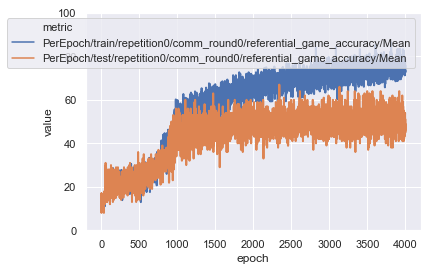

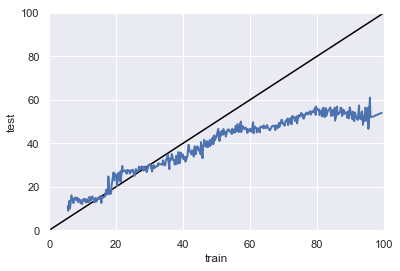

In [22]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

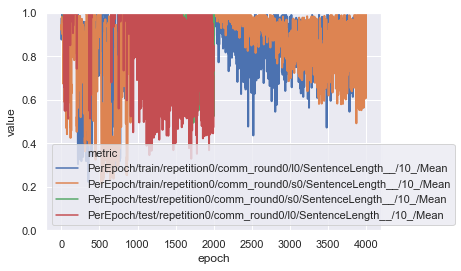

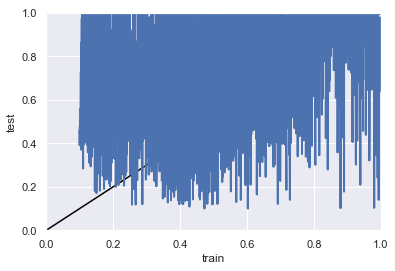

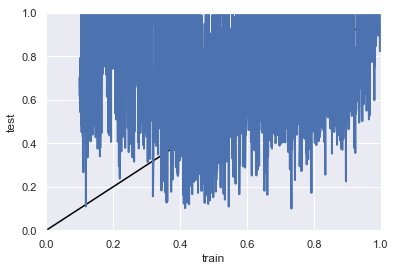

In [23]:
metrics = [
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False, 
    nbr_epochs=-1,
    regex_pattern=None,
)

In [24]:
to_replace = {
    'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
    'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
}
fused_df = df_runs_dict[intervention].reset_index(inplace=False, drop=True)
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] += 1
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/s0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df = fused_df.replace(to_replace=to_replace, inplace=False)

In [25]:
m1 = "test/IC"
#m1 = "PerEpoch/train/l0_inst_coord_metric/IC"
m2 = "PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.35357432184156246, pvalue=0.0)


In [26]:
#m1 = "test/IC"
m1 = "PerEpoch/train/l0_inst_coord_metric/IC"
m2 = "PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.1821515310829255, pvalue=8.477800226738475e-149)


In [27]:
#m1 = "test/IC"
m1 = "PerEpoch/train/l0_inst_coord_metric/IC"
m2 = "PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.20440851695373774, pvalue=1.1272490237417568e-187)


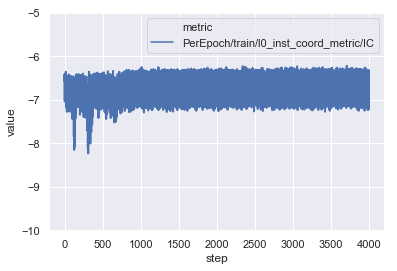

In [28]:
metrics = [
        #'PerEpoch/test/s0_inst_coord_metric/IC', 
        #"test/IC",
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=fused_df,
    metrics=metrics, 
    percentage=False,
    bottom=-10.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

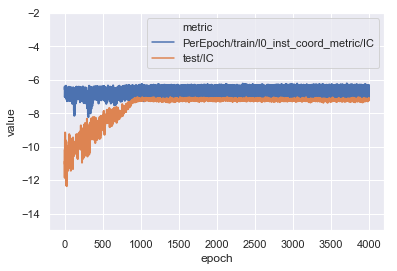

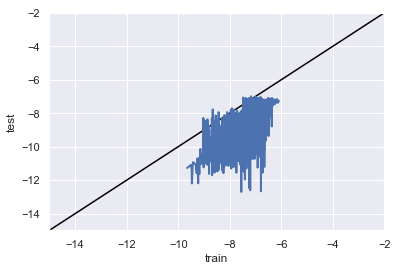

In [29]:
metrics = [
        #'PerEpoch/test/s0_inst_coord_metric/IC', 
        "test/IC",
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=fused_df,
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-2.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

In [30]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/test/l0_factor_vae_disentanglement_metric/\
DisentanglementMetric/FactorVAE/eval_accuracy/mean' ")

,metric,value,timepoint,step,source,epoch
22,PerEpoch/test/l0_factor_vae_disentanglement_me...,50.0,646,0,/scratch/staff/kyd500/development/MineRL/Refer...,0
538,PerEpoch/test/l0_factor_vae_disentanglement_me...,36.0,6074,1,/scratch/staff/kyd500/development/MineRL/Refer...,20
1052,PerEpoch/test/l0_factor_vae_disentanglement_me...,42.0,11536,2,/scratch/staff/kyd500/development/MineRL/Refer...,40
1568,PerEpoch/test/l0_factor_vae_disentanglement_me...,45.0,17014,3,/scratch/staff/kyd500/development/MineRL/Refer...,60
2086,PerEpoch/test/l0_factor_vae_disentanglement_me...,56.0,22496,4,/scratch/staff/kyd500/development/MineRL/Refer...,80
...,...,...,...,...,...,...
515869,PerEpoch/test/l0_factor_vae_disentanglement_me...,60.0,1074856,196,/scratch/staff/kyd500/development/MineRL/Refer...,3920
516387,PerEpoch/test/l0_factor_vae_disentanglement_me...,72.0,1080338,197,/scratch/staff/kyd500/development/MineRL/Refer...,3940
516905,PerEpoch/test/l0_factor_vae_disentanglement_me...,67.0,1085820,198,/scratch/staff/kyd500/development/MineRL/Refer...,3960
517423,PerEpoch/test/l0_factor_vae_disentanglement_me...,69.0,1091302,199,/scratch/staff/kyd500/development/MineRL/Refer...,3980


In [31]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/train/l0_inst_coord_metric/IC'")

,metric,value,timepoint,step,source,epoch
14,PerEpoch/train/l0_inst_coord_metric/IC,-6.574295,128,0,/scratch/staff/kyd500/development/MineRL/Refer...,0
93,PerEpoch/train/l0_inst_coord_metric/IC,-6.410385,932,1,/scratch/staff/kyd500/development/MineRL/Refer...,1
116,PerEpoch/train/l0_inst_coord_metric/IC,-7.033993,1178,2,/scratch/staff/kyd500/development/MineRL/Refer...,2
139,PerEpoch/train/l0_inst_coord_metric/IC,-6.923415,1424,3,/scratch/staff/kyd500/development/MineRL/Refer...,3
162,PerEpoch/train/l0_inst_coord_metric/IC,-6.558976,1670,4,/scratch/staff/kyd500/development/MineRL/Refer...,4
...,...,...,...,...,...,...
517841,PerEpoch/train/l0_inst_coord_metric/IC,-6.293045,1095282,3996,/scratch/staff/kyd500/development/MineRL/Refer...,3996
517864,PerEpoch/train/l0_inst_coord_metric/IC,-6.281250,1095528,3997,/scratch/staff/kyd500/development/MineRL/Refer...,3997
517887,PerEpoch/train/l0_inst_coord_metric/IC,-6.821614,1095774,3998,/scratch/staff/kyd500/development/MineRL/Refer...,3998
517910,PerEpoch/train/l0_inst_coord_metric/IC,-7.196784,1096020,3999,/scratch/staff/kyd500/development/MineRL/Refer...,3999


## Referential Game: Synth. Comp. From Epoch 1 :  NLL-Descr0.5 Distr. K=0 Obverter+BN+DP0.5


In [32]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter"

In [33]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"May20th/InterventionSyntheticCompositionalLanguage/WithObverterRoundAlternation/ProgressionEnd1/DecisionHeadBN/ListenerDecisionHeadDP0.5Only/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED10-partial-obs_b64_minib64_lr0.0006-synthetic_obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

19121it [00:00, 97820.33it/s] 

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/May20th/InterventionSyntheticCompositionalLanguage/WithObverterRoundAlternation/ProgressionEnd1/DecisionHeadBN/ListenerDecisionHeadDP0.5Only/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-synthetic_obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRep

930132it [00:09, 99765.98it/s] 
19293it [00:00, 97703.33it/s]

Metric Period = 50


930104it [00:09, 100167.87it/s]
19246it [00:00, 96465.81it/s]

Metric Period = 50


930112it [00:09, 100788.44it/s]
20383it [00:00, 104065.50it/s]

Metric Period = 50


930172it [00:09, 99880.51it/s] 
20085it [00:00, 102164.27it/s]

Metric Period = 50


930152it [00:09, 98163.93it/s] 


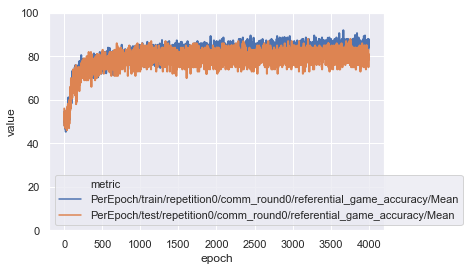

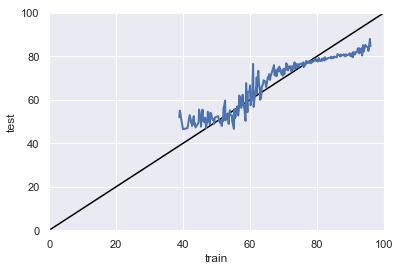

In [34]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

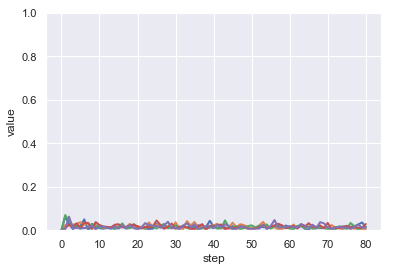

In [36]:
metrics = [
        "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
]
g = filtered_graph(
    #df_runs=combined_df.query(f"condition=='{intervention}'"),
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    #err_style='band',
    err_style='bars',
    linewidth=2,
    #hue="metric",
    hue="source",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    #palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)
    

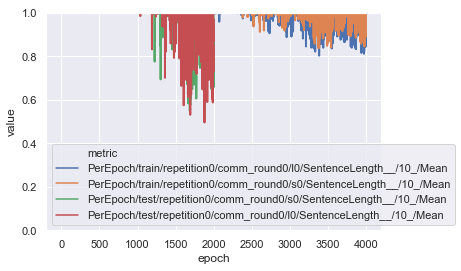

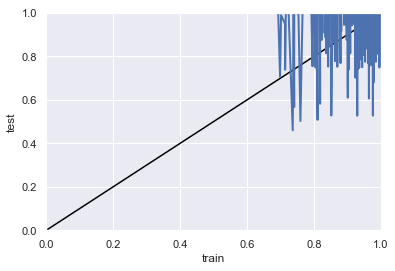

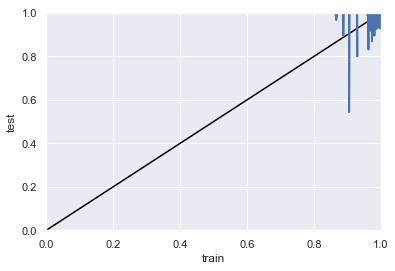

In [37]:
metrics = [
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False, 
    nbr_epochs=-1,
    regex_pattern=None,
)

In [38]:
to_replace = {
    'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
    'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
}
fused_df = df_runs_dict[intervention].reset_index(inplace=False, drop=True)
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] += 1
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/s0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df = fused_df.replace(to_replace=to_replace, inplace=False)

In [39]:
m1 = "test/IC"
m2 = "PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.22122786947123302, pvalue=2.78302411642144e-220)


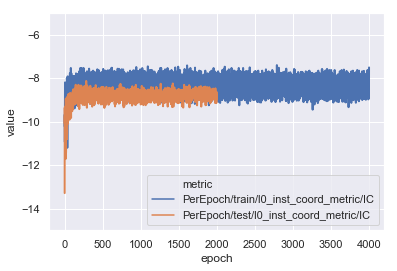

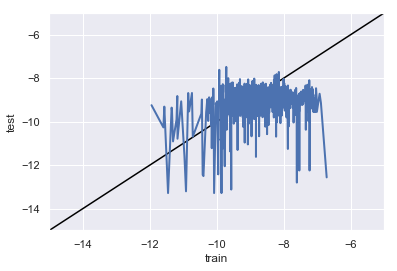

In [40]:
metrics = [
        'PerEpoch/test/l0_inst_coord_metric/IC', 
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

## Referential Game: NLL-Descr0.5 Distr. K=0 Obverter+BN

In [41]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "RG:NLL-Descr0.5-Distr0+BN-Obverter"

In [42]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"May20th/DecisionHeadBN/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED0-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod200+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

9049it [00:00, 90481.24it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/May20th/DecisionHeadBN/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 15
Number of event files found: 15
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zo

664046it [00:06, 103388.21it/s]
19891it [00:00, 101071.06it/s]

Metric Period = 200


664038it [00:06, 98785.99it/s] 
18806it [00:00, 92478.83it/s]

Metric Period = 200


664030it [00:06, 99191.54it/s] 
20455it [00:00, 104609.07it/s]

Metric Period = 200


664040it [00:06, 100443.26it/s]
10389it [00:00, 103882.92it/s]

Metric Period = 200


664006it [00:05, 112106.66it/s]
20241it [00:00, 103505.49it/s]

Metric Period = 200


664010it [00:05, 117476.54it/s]
10475it [00:00, 104747.10it/s]

Metric Period = 200


664032it [00:05, 128962.20it/s]
10917it [00:00, 109166.46it/s]

Metric Period = 200


664046it [00:05, 129659.50it/s]
10910it [00:00, 109091.26it/s]

Metric Period = 200


664036it [00:05, 128316.31it/s]
10444it [00:00, 104436.86it/s]

Metric Period = 200


664038it [00:05, 125705.70it/s]
10932it [00:00, 109315.93it/s]

Metric Period = 200


664026it [00:05, 111792.18it/s]
20018it [00:00, 101922.05it/s]

Metric Period = 200


663908it [00:06, 98395.21it/s] 
18688it [00:00, 91491.73it/s]

Metric Period = 200


664026it [00:06, 99663.97it/s] 
20273it [00:00, 103847.33it/s]

Metric Period = 200


664030it [00:06, 98332.78it/s] 
19936it [00:00, 100566.28it/s]

Metric Period = 200


664028it [00:06, 100225.89it/s]


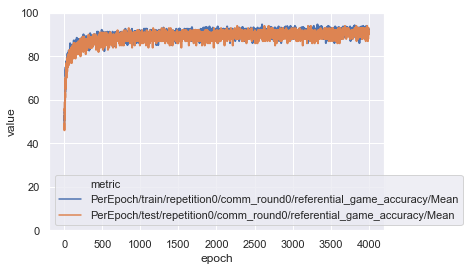

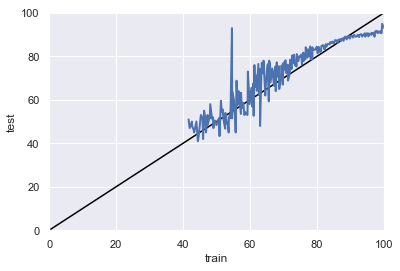

In [43]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

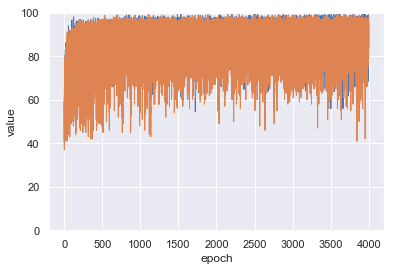

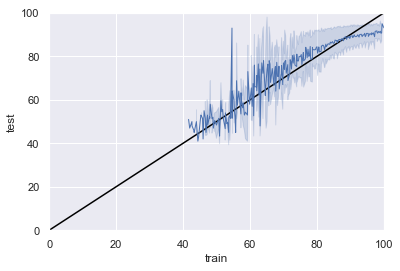

In [44]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]

g = filtered_graph(
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    err_style='band',
    #err_style='bars',
    linewidth=1,
    #hue="metric",
    #hue="source",
    #style="source",
    style=None,
    nbr_epochs=-1,
    percentage=True,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    #palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)
    

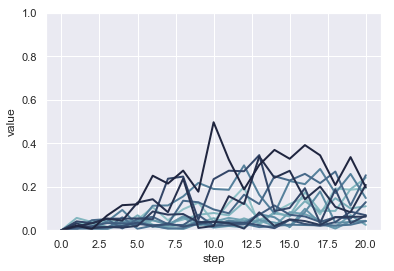

In [45]:
metrics = [
        "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
]
g = filtered_graph(
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    #err_style='band',
    err_style='bars',
    linewidth=2,
    #hue="metric",
    hue="source",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)
    

In [46]:
print(set(df_runs_dict[intervention].metric))

{'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/Discretized', 'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim/significant', 'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_Features/PValues', 'PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Q3', 'PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/NonNullEntropy-MutualInformationGap/MIGScore', 'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred', 'PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Std', 'PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/NormalizedMutualInformationGap/factor_2', 'PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/IQR', 'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/TopoSi

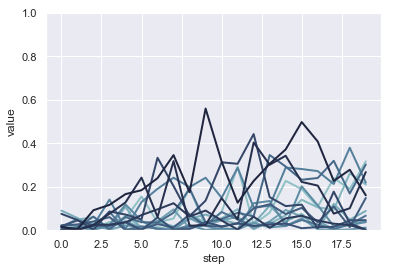

In [47]:
metrics = [
    "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/NonNullEntropy-NormalizedMutualInformationGap/factor_0",
    "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/NonNullEntropy-NormalizedMutualInformationGap/factor_0",

]
g = filtered_graph(
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    #err_style='band',
    err_style='bars',
    linewidth=2,
    #hue="metric",
    hue="source",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)
    

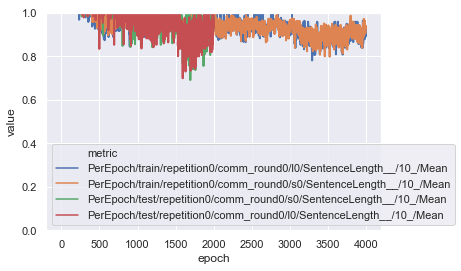

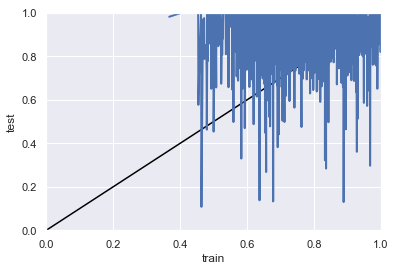

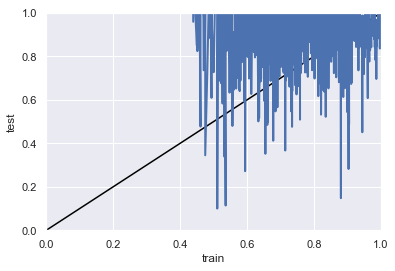

In [48]:
metrics = [
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False, 
    nbr_epochs=-1,
    regex_pattern=None,
)

In [49]:
to_replace = {
    'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
    'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
}
fused_df = df_runs_dict[intervention].reset_index(inplace=False, drop=True)
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] += 1
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/s0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df = fused_df.replace(to_replace=to_replace, inplace=False)

In [50]:
m1 = "test/IC"
m2 = "PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.10569100338056801, pvalue=1.2522667639161112e-148)


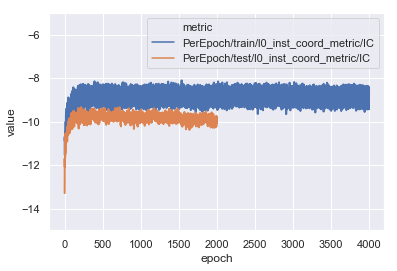

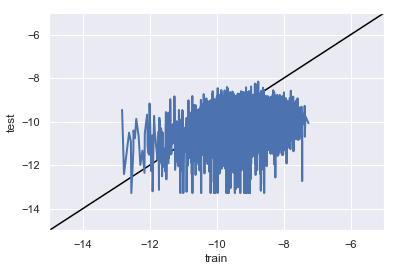

In [51]:
metrics = [
        'PerEpoch/test/l0_inst_coord_metric/IC', 
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

In [52]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean' & epoch==4000 ")

,metric,value,timepoint,step,source,epoch
101209,PerEpoch/train/repetition0/comm_round0/referen...,91.145836,663350,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
202494,PerEpoch/train/repetition0/comm_round0/referen...,92.187500,663342,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
303775,PerEpoch/train/repetition0/comm_round0/referen...,95.833336,663334,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
405061,PerEpoch/train/repetition0/comm_round0/referen...,93.229164,663344,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
506332,PerEpoch/train/repetition0/comm_round0/referen...,90.625000,663314,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
607603,PerEpoch/train/repetition0/comm_round0/referen...,83.854164,663318,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
708883,PerEpoch/train/repetition0/comm_round0/referen...,86.979164,663336,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
810172,PerEpoch/train/repetition0/comm_round0/referen...,93.229164,663350,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
911456,PerEpoch/train/repetition0/comm_round0/referen...,91.666664,663340,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
1012741,PerEpoch/train/repetition0/comm_round0/referen...,91.145836,663342,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000


In [53]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/test/l0_factor_vae_disentanglement_metric/\
DisentanglementMetric/FactorVAE/eval_accuracy/mean' ")

,metric,value,timepoint,step,source,epoch
23,PerEpoch/test/l0_factor_vae_disentanglement_me...,0.0,558,0,/scratch/staff/kyd500/development/MineRL/Refer...,0
5069,PerEpoch/test/l0_factor_vae_disentanglement_me...,55.0,33690,1,/scratch/staff/kyd500/development/MineRL/Refer...,200
10130,PerEpoch/test/l0_factor_vae_disentanglement_me...,59.0,66858,2,/scratch/staff/kyd500/development/MineRL/Refer...,400
15191,PerEpoch/test/l0_factor_vae_disentanglement_me...,62.0,100026,3,/scratch/staff/kyd500/development/MineRL/Refer...,600
20252,PerEpoch/test/l0_factor_vae_disentanglement_me...,43.0,133194,4,/scratch/staff/kyd500/development/MineRL/Refer...,800
...,...,...,...,...,...,...
1498911,PerEpoch/test/l0_factor_vae_disentanglement_me...,42.0,531192,16,/scratch/staff/kyd500/development/MineRL/Refer...,3200
1503972,PerEpoch/test/l0_factor_vae_disentanglement_me...,41.0,564360,17,/scratch/staff/kyd500/development/MineRL/Refer...,3400
1509031,PerEpoch/test/l0_factor_vae_disentanglement_me...,38.0,597524,18,/scratch/staff/kyd500/development/MineRL/Refer...,3600
1514092,PerEpoch/test/l0_factor_vae_disentanglement_me...,33.0,630692,19,/scratch/staff/kyd500/development/MineRL/Refer...,3800


## Referential Game: NLL-Descr0.5 Distr. K=0 Obverter+BN (Confidence Threshold : 0.85)

In [156]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter"

In [157]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"May27th/DecisionHeadBN/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED10-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.85-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

11934it [00:00, 61607.80it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/May27th/DecisionHeadBN/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.85-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/

698028it [00:07, 96384.69it/s] 
19900it [00:00, 102105.05it/s]

Metric Period = 50


698066it [00:07, 98806.21it/s] 
19654it [00:00, 100329.65it/s]

Metric Period = 50


698064it [00:07, 98771.15it/s] 
18970it [00:00, 93897.23it/s]

Metric Period = 50


698078it [00:06, 100075.65it/s]
20844it [00:00, 106796.59it/s]

Metric Period = 50


698060it [00:07, 99257.83it/s] 


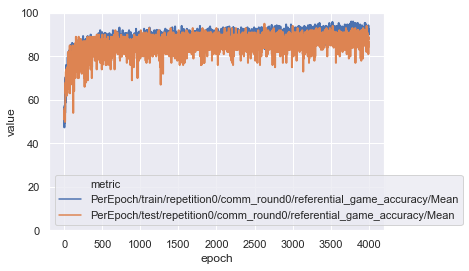

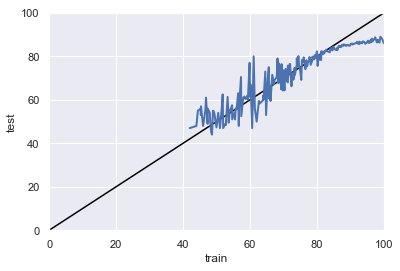

In [158]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

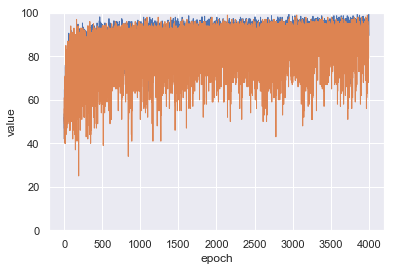

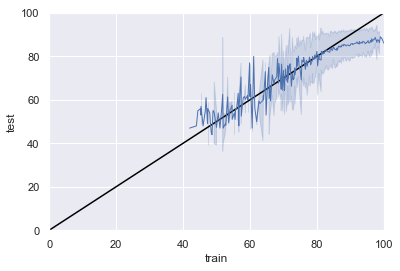

In [159]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]

g = filtered_graph(
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    err_style='band',
    #err_style='bars',
    linewidth=1,
    #hue="metric",
    #hue="source",
    #style="source",
    style=None,
    nbr_epochs=-1,
    percentage=True,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    #palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)
    

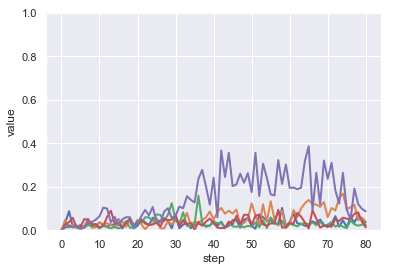

In [161]:
metrics = [
        "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
]
g = filtered_graph(
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    #err_style='band',
    err_style='bars',
    linewidth=2,
    #hue="metric",
    hue="source",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    #palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)
    

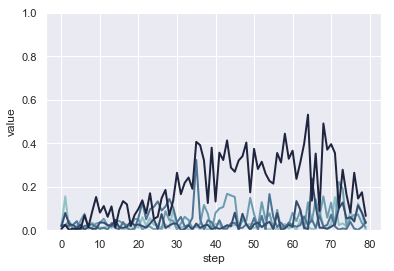

In [162]:
metrics = [
    "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/NonNullEntropy-NormalizedMutualInformationGap/factor_0",
    "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/NonNullEntropy-NormalizedMutualInformationGap/factor_0",

]
g = filtered_graph(
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    #err_style='band',
    err_style='bars',
    linewidth=2,
    #hue="metric",
    hue="source",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    palette=sns.cubehelix_palette(5, rot=-.25, light=.7),
    
)
    

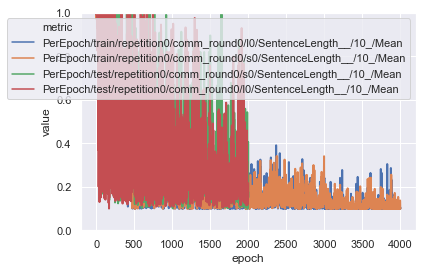

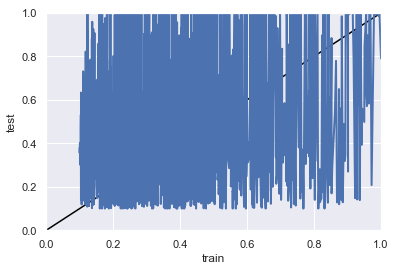

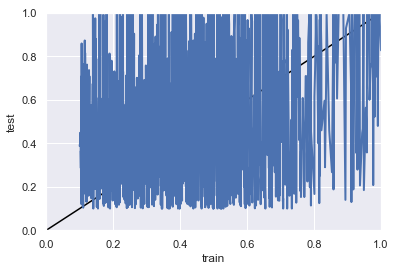

In [163]:
metrics = [
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False, 
    nbr_epochs=-1,
    regex_pattern=None,
)

In [164]:
to_replace = {
    'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
    'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
}
fused_df = df_runs_dict[intervention].reset_index(inplace=False, drop=True)
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] += 1
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/s0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df = fused_df.replace(to_replace=to_replace, inplace=False)

In [165]:
m1 = "test/IC"
m2 = "PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.1409936669470008, pvalue=2.421245452226788e-89)


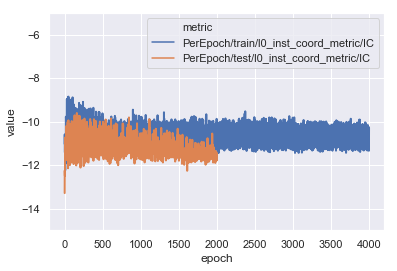

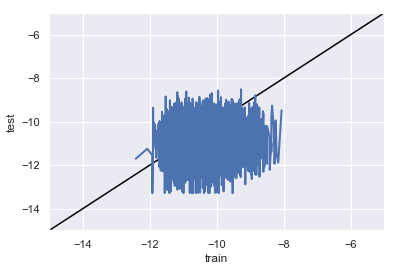

In [166]:
metrics = [
        'PerEpoch/test/l0_inst_coord_metric/IC', 
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

## Referential Game: NLL-Descr0.5 Distr. K=0 Obverter+BN+DP0.5


In [54]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter"

In [55]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"May20th/DecisionHeadBN/ListenerDecisionHeadDP0.5Only/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED10-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

10057it [00:00, 100565.54it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/May20th/DecisionHeadBN/ListenerDecisionHeadDP0.5Only/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 15
Number of event files found: 15
/scratch/staff/kyd500/develo

664036it [00:06, 100397.41it/s]
20652it [00:00, 105708.49it/s]

Metric Period = 200


664010it [00:06, 99751.94it/s] 
20477it [00:00, 105103.27it/s]

Metric Period = 50


698032it [00:06, 102810.54it/s]
20488it [00:00, 104414.66it/s]

Metric Period = 200


664038it [00:06, 100148.73it/s]
18752it [00:00, 91448.66it/s]

Metric Period = 200


664038it [00:06, 99206.43it/s] 
11135it [00:00, 111342.94it/s]

Metric Period = 200


664042it [00:06, 98274.49it/s] 
10474it [00:00, 104730.61it/s]

Metric Period = 50


698074it [00:07, 99229.44it/s] 
19686it [00:00, 99143.77it/s] 

Metric Period = 50


698030it [00:06, 99871.19it/s] 
10591it [00:00, 105901.26it/s]

Metric Period = 50


698044it [00:07, 98329.88it/s] 
18883it [00:00, 95221.18it/s]

Metric Period = 50


698060it [00:07, 98707.85it/s] 
20516it [00:00, 105360.33it/s]

Metric Period = 50


698094it [00:06, 105668.61it/s]
11009it [00:00, 110082.76it/s]

Metric Period = 50


698028it [00:06, 100151.42it/s]
20639it [00:00, 105655.58it/s]

Metric Period = 50


697996it [00:06, 104440.45it/s]
20729it [00:00, 105525.65it/s]

Metric Period = 50


698054it [00:06, 100030.12it/s]
19784it [00:00, 100377.02it/s]

Metric Period = 50


698064it [00:06, 100073.47it/s]


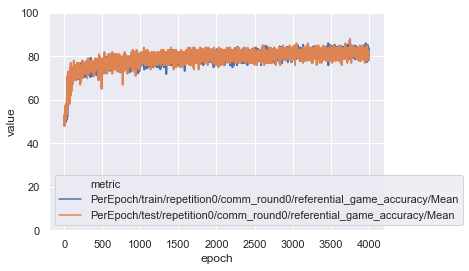

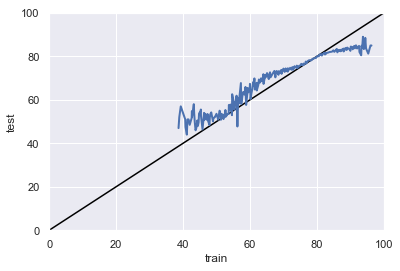

In [56]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

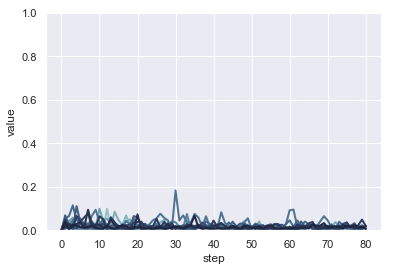

In [58]:
metrics = [
        "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
]
g = filtered_graph(
    #df_runs=combined_df.query(f"condition=='{intervention}'"),
    df_runs=df_runs_dict[intervention],
    filtering_keys=metrics, 
    logscale=False,
    ci="sd",
    #err_style='band',
    err_style='bars',
    linewidth=2,
    #hue="metric",
    hue="source",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)
    

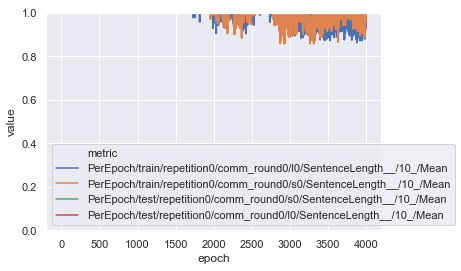

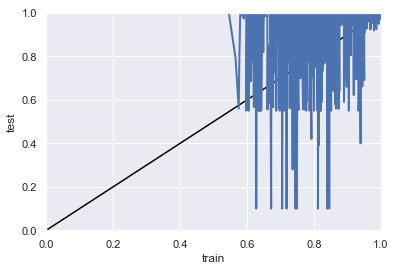

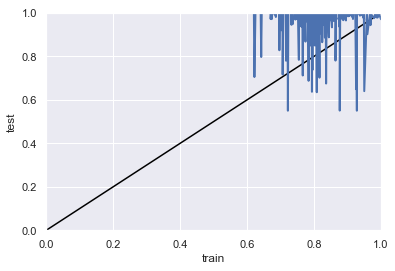

In [59]:
metrics = [
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False, 
    nbr_epochs=-1,
    regex_pattern=None,
)

In [60]:
to_replace = {
    'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
    'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
}
fused_df = df_runs_dict[intervention].reset_index(inplace=False, drop=True)
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] += 1
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/s0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df = fused_df.replace(to_replace=to_replace, inplace=False)

In [61]:
m1 = "test/IC"
m2 = "PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.33172239147719385, pvalue=0.0)


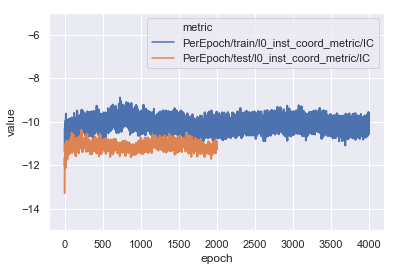

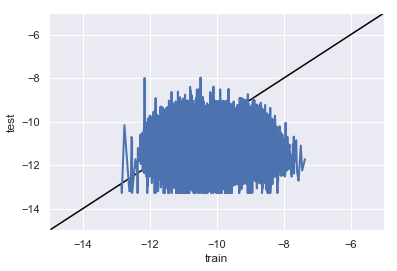

In [62]:
metrics = [
        'PerEpoch/test/l0_inst_coord_metric/IC', 
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

In [63]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean' ")

,metric,value,timepoint,step,source,epoch
6,PerEpoch/train/repetition0/comm_round0/referen...,47.395832,36,0,/scratch/staff/kyd500/development/MineRL/Refer...,0
75,PerEpoch/train/repetition0/comm_round0/referen...,52.666668,721,1,/scratch/staff/kyd500/development/MineRL/Refer...,1
100,PerEpoch/train/repetition0/comm_round0/referen...,50.925926,884,2,/scratch/staff/kyd500/development/MineRL/Refer...,2
125,PerEpoch/train/repetition0/comm_round0/referen...,56.666668,1047,3,/scratch/staff/kyd500/development/MineRL/Refer...,3
150,PerEpoch/train/repetition0/comm_round0/referen...,55.208332,1210,4,/scratch/staff/kyd500/development/MineRL/Refer...,4
...,...,...,...,...,...,...
1555330,PerEpoch/train/repetition0/comm_round0/referen...,83.333336,696716,3996,/scratch/staff/kyd500/development/MineRL/Refer...,3996
1555355,PerEpoch/train/repetition0/comm_round0/referen...,80.666664,696879,3997,/scratch/staff/kyd500/development/MineRL/Refer...,3997
1555380,PerEpoch/train/repetition0/comm_round0/referen...,77.777779,697042,3998,/scratch/staff/kyd500/development/MineRL/Refer...,3998
1555405,PerEpoch/train/repetition0/comm_round0/referen...,78.000000,697205,3999,/scratch/staff/kyd500/development/MineRL/Refer...,3999


In [64]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/test/l0_factor_vae_disentanglement_metric/\
DisentanglementMetric/FactorVAE/eval_accuracy/mean' ")

,metric,value,timepoint,step,source,epoch
23,PerEpoch/test/l0_factor_vae_disentanglement_me...,0.0,558,0,/scratch/staff/kyd500/development/MineRL/Refer...,0
5067,PerEpoch/test/l0_factor_vae_disentanglement_me...,57.0,33686,1,/scratch/staff/kyd500/development/MineRL/Refer...,200
10128,PerEpoch/test/l0_factor_vae_disentanglement_me...,59.0,66854,2,/scratch/staff/kyd500/development/MineRL/Refer...,400
15189,PerEpoch/test/l0_factor_vae_disentanglement_me...,64.0,100022,3,/scratch/staff/kyd500/development/MineRL/Refer...,600
20250,PerEpoch/test/l0_factor_vae_disentanglement_me...,54.0,133190,4,/scratch/staff/kyd500/development/MineRL/Refer...,800
...,...,...,...,...,...,...
1550205,PerEpoch/test/l0_factor_vae_disentanglement_me...,66.0,663028,76,/scratch/staff/kyd500/development/MineRL/Refer...,3800
1551516,PerEpoch/test/l0_factor_vae_disentanglement_me...,62.0,671746,77,/scratch/staff/kyd500/development/MineRL/Refer...,3850
1552825,PerEpoch/test/l0_factor_vae_disentanglement_me...,66.0,680460,78,/scratch/staff/kyd500/development/MineRL/Refer...,3900
1554136,PerEpoch/test/l0_factor_vae_disentanglement_me...,71.0,689178,79,/scratch/staff/kyd500/development/MineRL/Refer...,3950


## Referential Game: Hinge NoDescr. Distr. K=7 Obverter

In [65]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "RG:Obverter"

In [66]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"DecisionHeadDP0.5/3DShapesPyBullet+DualLabeled/\
AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/\
4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0\
_DPEmb0.0_BN_learning/Hinge3DShapePyBullet-dataset-imgS128-shapes5\
-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C\
-Rep1-S1L1-None-ResetuniformSL-ObjectCentricCulturalAgent-SEED0\
-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/\
uniformDistrTrain7Test7-stim1-vocab10over10_BN+\
BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/\
ObverterWith2OututsDecisionHead0.8-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/\
DEBUG/MetricPeriod20+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors\
+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

19557it [00:00, 98631.02it/s] 

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/DecisionHeadDP0.5/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/Hinge3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricCulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain7Test7-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.8-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+

864335it [00:08, 98861.26it/s] 
20454it [00:00, 104434.83it/s]

Metric Period = 20


864781it [00:08, 99661.64it/s] 
20058it [00:00, 102248.82it/s]

Metric Period = 20


865019it [00:08, 99046.16it/s] 
20060it [00:00, 102112.27it/s]

Metric Period = 20


862439it [00:08, 98978.06it/s] 
19165it [00:00, 98179.10it/s] 

Metric Period = 20


864855it [00:08, 99395.45it/s] 


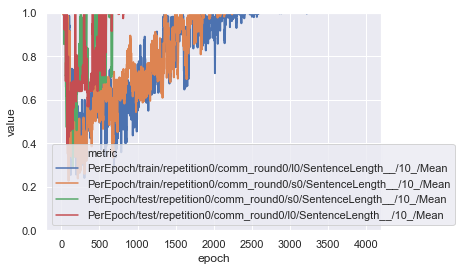

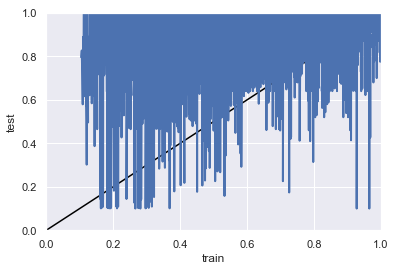

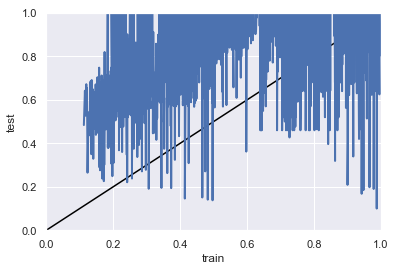

In [67]:
metrics = [
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False, 
    nbr_epochs=-1,
    regex_pattern=None,
)

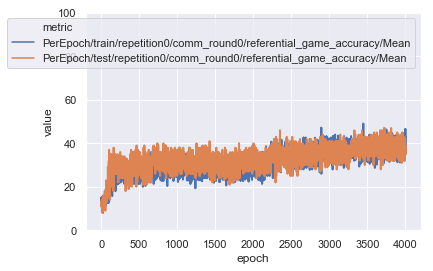

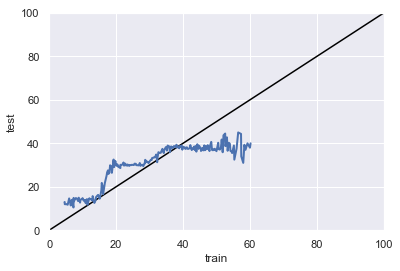

In [68]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

In [69]:
to_replace = {
    'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
    'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
}
fused_df = df_runs_dict[intervention].reset_index(inplace=False, drop=True)
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/l0_inst_coord_metric/IC']), "epoch"] += 1
fused_df.loc[fused_df.metric.isin(['PerEpoch/test/s0_inst_coord_metric/IC']), "epoch"] *= 2
fused_df = fused_df.replace(to_replace=to_replace, inplace=False)

In [70]:
m1 = "test/IC"
m2 = "PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean"
sp_rho = stats.spearmanr(
    fused_df[fused_df.metric.isin([m1])].value,
    fused_df[fused_df.metric.isin([m2])].value
)
print(sp_rho)

SpearmanrResult(correlation=0.17798764894896546, pvalue=4.679124438322665e-142)


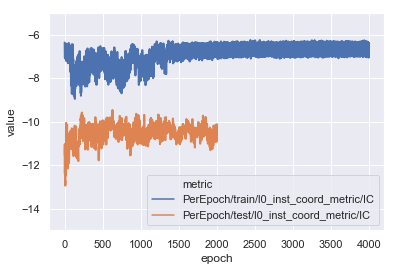

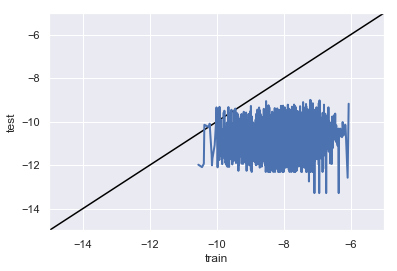

In [71]:
metrics = [
        'PerEpoch/test/l0_inst_coord_metric/IC', 
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

In [72]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean' & epoch==4000 ")

,metric,value,timepoint,step,source,epoch
103480,PerEpoch/train/repetition0/comm_round0/referen...,34.895832,863638,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
207086,PerEpoch/train/repetition0/comm_round0/referen...,21.354166,864080,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
310701,PerEpoch/train/repetition0/comm_round0/referen...,34.375000,864318,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
414208,PerEpoch/train/repetition0/comm_round0/referen...,45.312500,861738,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
517741,PerEpoch/train/repetition0/comm_round0/referen...,36.979168,864154,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000


In [73]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/test/l0_factor_vae_disentanglement_metric/\
DisentanglementMetric/FactorVAE/eval_accuracy/mean' ")

,metric,value,timepoint,step,source,epoch
22,PerEpoch/test/l0_factor_vae_disentanglement_me...,46.0,490,0,/scratch/staff/kyd500/development/MineRL/Refer...,0
536,PerEpoch/test/l0_factor_vae_disentanglement_me...,43.0,4742,1,/scratch/staff/kyd500/development/MineRL/Refer...,20
1050,PerEpoch/test/l0_factor_vae_disentanglement_me...,26.0,8994,2,/scratch/staff/kyd500/development/MineRL/Refer...,40
1564,PerEpoch/test/l0_factor_vae_disentanglement_me...,43.0,13308,3,/scratch/staff/kyd500/development/MineRL/Refer...,60
2082,PerEpoch/test/l0_factor_vae_disentanglement_me...,50.0,17630,4,/scratch/staff/kyd500/development/MineRL/Refer...,80
...,...,...,...,...,...,...
515685,PerEpoch/test/l0_factor_vae_disentanglement_me...,49.0,847406,196,/scratch/staff/kyd500/development/MineRL/Refer...,3920
516203,PerEpoch/test/l0_factor_vae_disentanglement_me...,70.0,851728,197,/scratch/staff/kyd500/development/MineRL/Refer...,3940
516721,PerEpoch/test/l0_factor_vae_disentanglement_me...,57.0,856050,198,/scratch/staff/kyd500/development/MineRL/Refer...,3960
517239,PerEpoch/test/l0_factor_vae_disentanglement_me...,50.0,860372,199,/scratch/staff/kyd500/development/MineRL/Refer...,3980


## Referential Game: 3dShapesPyBullet-DecisionHeadBN-ListenerDP0.1-Hinge-Descr-DistrK=7 Obverter

In [74]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/'

In [75]:
factor_val = 0.0
intervention = "RG:Hinge-Descr+Discr7-Obverter"
batch_size = 64
paths[intervention] = f"May19th/DecisionHeadBN/ListenerDecisionHeadDP0.1Only/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/Hinge3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.8888888888888888CulturalAgent-SEED0-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain7Test7-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod20+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

19336it [00:00, 98909.97it/s] 

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/PoorlyDiverseStimuli/May19th/DecisionHeadBN/ListenerDecisionHeadDP0.1Only/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/Hinge3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.8888888888888888CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2/uniformDistrTrain7Test7-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scr

882197it [00:08, 99479.39it/s] 
19534it [00:00, 99508.62it/s] 

Metric Period = 20


882287it [00:08, 98881.84it/s] 
20046it [00:00, 102131.01it/s]

Metric Period = 20


882259it [00:08, 99549.36it/s] 
20064it [00:00, 102018.72it/s]

Metric Period = 20


882267it [00:08, 99252.76it/s] 
10627it [00:00, 106266.81it/s]

Metric Period = 20


882251it [00:08, 98280.16it/s] 


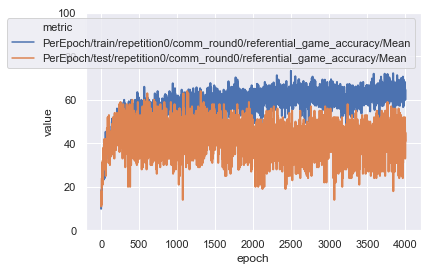

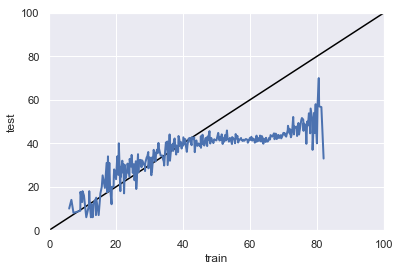

In [76]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

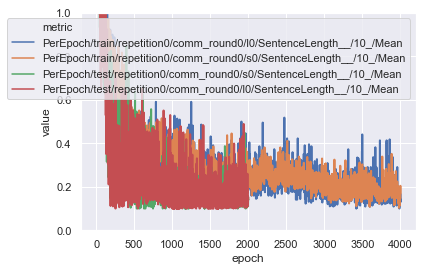

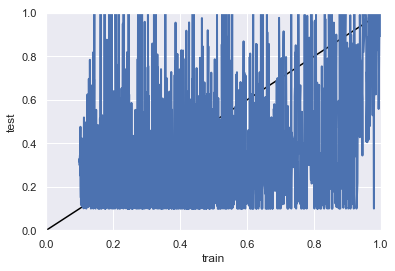

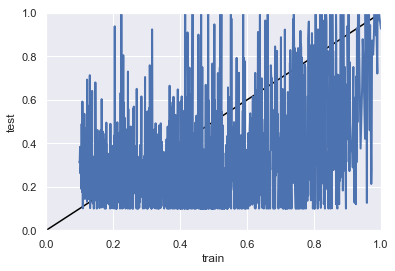

In [77]:
metrics = [
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False, 
    nbr_epochs=-1,
    regex_pattern=None,
)

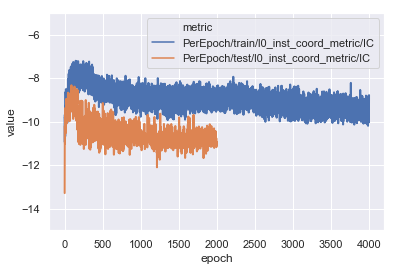

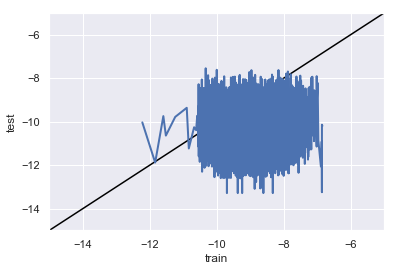

In [78]:
metrics = [
        'PerEpoch/test/l0_inst_coord_metric/IC', 
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

## Referential Game: 3dShapesPyBullet - Synth. Comp. STGS NLL-Descr0.5-NoDistr 

In [95]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "Synth. Comp. RG:NLL-Descr.0.5-STGS"

In [96]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"May26th/InterventionSyntheticCompositionalLanguage/ProgressionEnd1/3DShapesPyBullet+DualLabeled/AdamEPS1e-16/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED10-partial-obs_b64_minib64_lr0.0006-synthetic_straight_through_gumbel_softmax-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/STGS-Baseline-LSTM-CNN-Agent/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod200+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

8014it [00:00, 80138.36it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/May26th/InterventionSyntheticCompositionalLanguage/ProgressionEnd1/3DShapesPyBullet+DualLabeled/AdamEPS1e-16/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-synthetic_straight_through_gumbel_softmax-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/STGS-Baseline-LSTM-CNN-Agent/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineRL/R

1078648it [00:10, 100937.53it/s]
20294it [00:00, 103963.31it/s]

Metric Period = 200


1078624it [00:11, 94929.77it/s]
20748it [00:00, 107804.57it/s]

Metric Period = 200


1078632it [00:11, 92160.42it/s]
8795it [00:00, 87943.37it/s]

Metric Period = 200


1078640it [00:11, 91756.50it/s]
18719it [00:00, 94641.99it/s]

Metric Period = 200


1078660it [00:11, 98040.41it/s] 


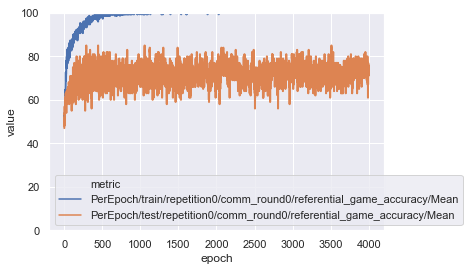

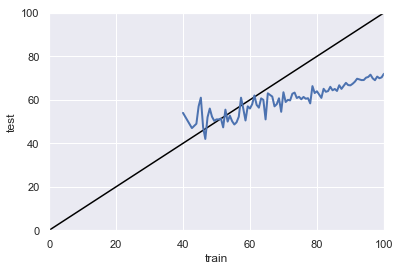

In [97]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

## Referential Game: 3dShapesPyBullet - Synth. Comp. NLL-Descr0.5-NoDistr Obverter +BN (Thresh. 0.98)

In [98]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter"

In [99]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"May26th/InterventionSyntheticCompositionalLanguage/WithObverterRoundAlternation/ProgressionEnd1/DecisionHeadBN/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED10-partial-obs_b64_minib64_lr0.0006-synthetic_obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod50+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

13292it [00:00, 64325.67it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/May26th/InterventionSyntheticCompositionalLanguage/WithObverterRoundAlternation/ProgressionEnd1/DecisionHeadBN/3DShapesPyBullet+DualLabeled/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-synthetic_obverter-tau0-0.2/uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0/LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.98-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path fo

930144it [00:09, 99663.28it/s] 
19984it [00:00, 102676.41it/s]

Metric Period = 50


930164it [00:09, 98417.78it/s] 
19829it [00:00, 100516.87it/s]

Metric Period = 50


930176it [00:09, 97270.49it/s] 
19768it [00:00, 101389.13it/s]

Metric Period = 50


930164it [00:09, 99560.79it/s] 
10762it [00:00, 107614.71it/s]

Metric Period = 50


930136it [00:09, 100432.88it/s]


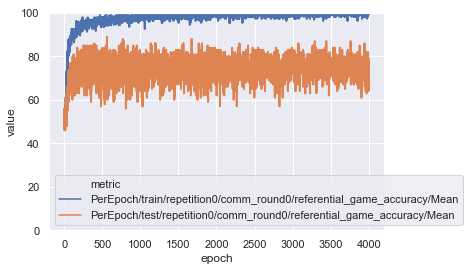

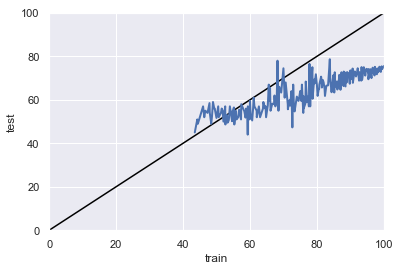

In [100]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

## Referential Game: 3dShapesPyBullet-DecisionHeadBN-NLL-Descr0.5-NoDistr Obverter

In [79]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/PoorlyDiverseStimuli-3dShapesPyBullet-DecisionHeadBN-NLL-Descr0.5-NoDistr/'
intervention = "RG:NLL-Descr.0.5-Obverter"

In [80]:
factor_val = 0.0
batch_size = 64
paths[intervention] = f"AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED0-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.75-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod200+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/"
df_runs_dict[intervention] = glob_data(
    paths[intervention], 
    nbr_epochs=-1,
    regex_pattern=regex_pattern,
)

19763it [00:00, 100433.08it/s]

/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/PoorlyDiverseStimuli-3dShapesPyBullet-DecisionHeadBN-NLL-Descr0.5-NoDistr/AdamEPS1e-16WithObverterSamplingRoundAlternationOnly/4001Ep_Emb64_CNN-1to32RNN64/shared_architectureDropout0.0_DPEmb0.0_BN_learning/NLL3DShapePyBullet-dataset-imgS128-shapes5-colors5-samples10-compositional-40-nb_train_colors_3/OBS64X3C-Rep1-S1L1-None-ResetuniformSL-ObjectCentricDescriptive0.5CulturalAgent-SEED*-partial-obs_b64_minib64_lr0.0006-obverter-tau0-0.2-uniformDistrTrain0Test0-stim1-vocab10over10_BN+BetaVAEEncoderOnly3x3/beta1.0-factor0.0LossVAECoeff0.0_/adam/ObverterWith2OututsDecisionHead0.75-2GPR/DEBUG_/WithSeparatedRoleMetric-AgentBased/DEBUG/MetricPeriod*+b16Resampling+DISComp-b16DisMetricResampling+ActiveFactors+NotNormalizedFeat+ResampleEncodeZ_train150_test100/DatasetRepTrain1Test1/
Number of path found: 5
Number of event files found: 5
/scratch/staff/kyd500/development/MineR

655590it [00:06, 99403.73it/s] 
18707it [00:00, 92622.54it/s]

Metric Period = 200


655582it [00:06, 99616.36it/s] 
20597it [00:00, 105299.19it/s]

Metric Period = 200


655584it [00:06, 99421.43it/s] 
20061it [00:00, 102238.77it/s]

Metric Period = 200


655588it [00:06, 98605.10it/s] 
20517it [00:00, 104835.37it/s]

Metric Period = 200


655548it [00:06, 100670.30it/s]


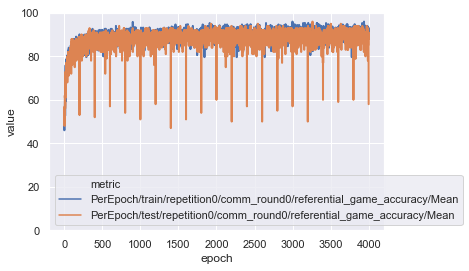

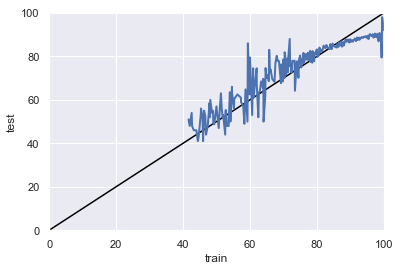

In [81]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=True, 
    nbr_epochs=-1,
    regex_pattern=None,
)

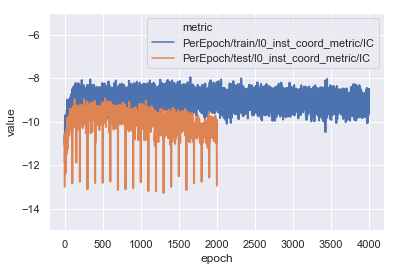

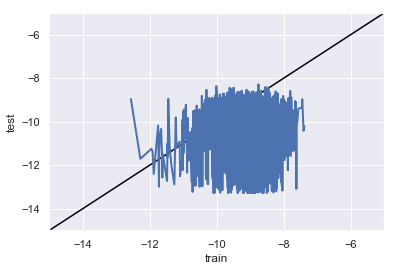

In [82]:
metrics = [
        'PerEpoch/test/l0_inst_coord_metric/IC', 
        'PerEpoch/train/l0_inst_coord_metric/IC'
]
g_acc, df_runs = glob_filter_draw(
    path=None,
    df_runs=df_runs_dict[intervention],
    metrics=metrics, 
    percentage=False,
    bottom=-15.0,
    top=-5.0,
    nbr_epochs=-1,
    regex_pattern=None,
)

In [83]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean' & epoch==4000 ")

,metric,value,timepoint,step,source,epoch
94308,PerEpoch/train/repetition0/comm_round0/referen...,90.104164,654936,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
188748,PerEpoch/train/repetition0/comm_round0/referen...,91.145836,654932,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
283187,PerEpoch/train/repetition0/comm_round0/referen...,96.875000,654934,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
377626,PerEpoch/train/repetition0/comm_round0/referen...,84.375000,654934,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000
472051,PerEpoch/train/repetition0/comm_round0/referen...,88.541664,654902,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000


In [167]:
df_runs_dict.keys()

dict_keys([0.0, 10.0, 20.0, 30.0, 40.0, 50.0, 'Synth. Comp.', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:Obverter', 'RG:Hinge-Descr+Discr7-Obverter', 'RG:NLL-Descr.0.5-Obverter', 'Synth. Comp. RG:NLL-Descr.0.5-STGS', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter'])

In [168]:
df_runs_dict[intervention].query(
"metric=='PerEpoch/test/s0_factor_vae_disentanglement_metric/\
DisentanglementMetric/FactorVAE/eval_accuracy/mean' ")

,metric,value,timepoint,step,source,epoch


In [169]:
factor_list = list(df_runs_dict.keys())
print(factor_list)

[0.0, 10.0, 20.0, 30.0, 40.0, 50.0, 'Synth. Comp.', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:Obverter', 'RG:Hinge-Descr+Discr7-Obverter', 'RG:NLL-Descr.0.5-Obverter', 'Synth. Comp. RG:NLL-Descr.0.5-STGS', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter']


In [170]:
condition_list = list(df_runs_dict.keys())
for idx in range(len(condition_list)):
    if isinstance(condition_list[idx], str):
        continue
    else:
        condition_list[idx] = fr"FactorVAE $\gamma={condition_list[idx]}$"
print(condition_list)

['FactorVAE $\\gamma=0.0$', 'FactorVAE $\\gamma=10.0$', 'FactorVAE $\\gamma=20.0$', 'FactorVAE $\\gamma=30.0$', 'FactorVAE $\\gamma=40.0$', 'FactorVAE $\\gamma=50.0$', 'Synth. Comp.', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:Obverter', 'RG:Hinge-Descr+Discr7-Obverter', 'RG:NLL-Descr.0.5-Obverter', 'Synth. Comp. RG:NLL-Descr.0.5-STGS', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter']


In [171]:
condition2epoch = {
    cond:{}
    for cond in condition_list
}
metrics=[
    "PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    "PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    "PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    "PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
]

# basis :
for cond in condition2epoch:
    if "FactorVAE" in cond:
        condition2epoch[cond] = {
            metric:80
            for metric in metrics
        }
    elif "NLL" in cond:
        condition2epoch[cond] = {
            metric: 4000 #20
            for metric in metrics
        }
    else:
        condition2epoch[cond] = {
            metric: 4000 #200
            for metric in metrics
        }
        
print(condition2epoch)

{'FactorVAE $\\gamma=0.0$': {'PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean': 80, 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore': 80, 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1': 80, 'PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean': 80, 'PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean': 80, 'PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore': 80, 'PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1': 80, 'PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore': 80, 'PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1

In [172]:
run_lengths = {
    factor: len(df_runs_dict[factor]['value']) 
    for factor in factor_list
}
print(run_lengths)

{0.0: 19440, 10.0: 16200, 20.0: 16200, 30.0: 16200, 40.0: 16200, 50.0: 16200, 'Synth. Comp.': 517998, 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter': 524621, 'RG:NLL-Descr0.5-Distr0+BN-Obverter': 1519216, 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter': 1555510, 'RG:Obverter': 517816, 'RG:Hinge-Descr+Discr7-Obverter': 561158, 'RG:NLL-Descr.0.5-Obverter': 472181, 'Synth. Comp. RG:NLL-Descr.0.5-STGS': 604433, 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter': 524677, 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter': 524578}


In [173]:
conditions = {
    factor:pd.Series([cond]*run_lengths[factor])
    for cond, factor in zip(condition_list, factor_list)
}
factors = {
    factor:pd.Series([str(factor)]*run_lengths[factor]) if not(isinstance(factor,str)) else pd.Series([0.0]*run_lengths[factor])
    for factor in factor_list
}

print(factors)
print(conditions)

{0.0: 0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
19435    0.0
19436    0.0
19437    0.0
19438    0.0
19439    0.0
Length: 19440, dtype: object, 10.0: 0        10.0
1        10.0
2        10.0
3        10.0
4        10.0
         ... 
16195    10.0
16196    10.0
16197    10.0
16198    10.0
16199    10.0
Length: 16200, dtype: object, 20.0: 0        20.0
1        20.0
2        20.0
3        20.0
4        20.0
         ... 
16195    20.0
16196    20.0
16197    20.0
16198    20.0
16199    20.0
Length: 16200, dtype: object, 30.0: 0        30.0
1        30.0
2        30.0
3        30.0
4        30.0
         ... 
16195    30.0
16196    30.0
16197    30.0
16198    30.0
16199    30.0
Length: 16200, dtype: object, 40.0: 0        40.0
1        40.0
2        40.0
3        40.0
4        40.0
         ... 
16195    40.0
16196    40.0
16197    40.0
16198    40.0
16199    40.0
Length: 16200, dtype: object, 50.0: 0        50.0
1        50.0
2        50.0
3        50.0

In [174]:
# Adding factors:
df_runs_dict_factors = {
    factor: df_runs_dict[factor].reset_index(inplace=False, drop=True)
    for factor in factor_list
}


for factor in factor_list:
    #df_runs_dict_factors[factor].reset_index(inplace=True)
    #conditions[factor].reset_index()
    df_runs_dict_factors[factor]["factor"] = factors[factor].reset_index(inplace=False, drop=True)
    df_runs_dict_factors[factor]["condition"] = conditions[factor].reset_index(inplace=False, drop=True)

    print(factor)
print(df_runs_dict_factors[10.0])

0.0
10.0
20.0
30.0
40.0
50.0
Synth. Comp.
Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter
RG:NLL-Descr0.5-Distr0+BN-Obverter
RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter
RG:Obverter
RG:Hinge-Descr+Discr7-Obverter
RG:NLL-Descr.0.5-Obverter
Synth. Comp. RG:NLL-Descr.0.5-STGS
Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter
RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
                                                  metric      value  \
0      PerEpoch/train/baseline_factor_vae_disentangle...  37.000000   
1      PerEpoch/train/baseline_modularity_disentangle...   0.745376   
2      PerEpoch/train/baseline_modularity_disentangle...   0.161661   
3      PerEpoch/train/baseline_modularity_disentangle...   0.543174   
4      PerEpoch/train/baseline_modularity_disentangle...   0.093414   
...                                                  ...        ...   
16195  PerEpoch/test/baseline_mig_disentanglement_met...   1.559829   
16196  PerEpoch/test/baseline_mig_disentanglement_met...   2.128

In [175]:
print(list(df_runs_dict_factors.keys()))

[0.0, 10.0, 20.0, 30.0, 40.0, 50.0, 'Synth. Comp.', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:Obverter', 'RG:Hinge-Descr+Discr7-Obverter', 'RG:NLL-Descr.0.5-Obverter', 'Synth. Comp. RG:NLL-Descr.0.5-STGS', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter']


In [176]:
filtered_df_runs = {
    key: df_runs_dict_factors[key]
    for key in [
        0.0, 
        10.0, 
        20.0, 
        30.0, 
        40.0, 
        50.0, 
        'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter',
        'Synth. Comp. RG:NLL-Descr.0.5-STGS',
        'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter',
        'RG:NLL-Descr0.5-Distr0+BN-Obverter',
        "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter",
        'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter',
    ]
}
print(filtered_df_runs)

{0.0:                                                   metric      value  \
0      PerEpoch/train/baseline_factor_vae_disentangle...  37.000000   
1      PerEpoch/train/baseline_modularity_disentangle...   0.743444   
2      PerEpoch/train/baseline_modularity_disentangle...   0.160396   
3      PerEpoch/train/baseline_modularity_disentangle...   0.543174   
4      PerEpoch/train/baseline_modularity_disentangle...   0.093414   
...                                                  ...        ...   
19435  PerEpoch/test/baseline_mig_disentanglement_met...   1.559829   
19436  PerEpoch/test/baseline_mig_disentanglement_met...   2.128792   
19437  PerEpoch/test/baseline_mig_disentanglement_met...   0.027062   
19438  PerEpoch/test/baseline_mig_disentanglement_met...   0.027062   
19439  PerEpoch/test/baseline_mig_disentanglement_met...  32.000000   

       timepoint  step                                             source  \
0            191     0  /scratch/staff/kyd500/development/MineRL

In [177]:
combined_df = pd.concat(filtered_df_runs.values())
                                         
for metric in set(combined_df['metric']):
    print(metric)

PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/Discretized
PerEpoch/train/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/NonDiscrModularityScore2
PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim/significant
PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_Features/PValues
PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Q3
PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/NonNullEntropy-MutualInformationGap/MIGScore
PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred
PerEpoch/train/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/nbr_active_dims
PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Std
PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformatio

In [178]:
import pickle

with open('./pd_baselines+synth-comp+rg-obverter.pickle', 'wb') as f:
    pickle.dump(combined_df, f, protocol=pickle.HIGHEST_PROTOCOL)


In [3]:
import pickle

with open('./pd_baselines+synth-comp+rg-obverter.pickle', 'rb') as f:
    combined_df = pickle.load(f)

combined_df.describe()

,value,timepoint,step,epoch
count,5.353475e+06,5.353475e+06,5.353475e+06,5.353475e+06
mean,5.098049e+00,3.945520e+05,1.672012e+03,1.763904e+03
std,2.317094e+01,2.500225e+05,1.159856e+03,1.131221e+03
min,-3.680239e+01,2.400000e+01,0.000000e+00,0.000000e+00
25%,0.000000e+00,1.896440e+05,6.830000e+02,8.070000e+02
50%,3.897114e-01,3.792370e+05,1.524000e+03,1.618000e+03
75%,1.000000e+00,5.688390e+05,2.606000e+03,2.693000e+03
max,1.000000e+02,1.517759e+06,4.000000e+03,4.000000e+03


In [4]:
condition_list = list(set(combined_df.condition))
print(condition_list)

['FactorVAE $\\gamma=30.0$', 'RG:NLL-Descr0.5-Distr0+BN-Obverter', 'FactorVAE $\\gamma=10.0$', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter', 'FactorVAE $\\gamma=0.0$', 'FactorVAE $\\gamma=40.0$', 'FactorVAE $\\gamma=50.0$', 'FactorVAE $\\gamma=20.0$', 'Synth. Comp. RG:NLL-Descr.0.5-STGS', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter']


In [5]:
combined_df.columns

Index(['metric', 'value', 'timepoint', 'step', 'source', 'epoch', 'factor',
       'condition'],
      dtype='object')

In [6]:
system_df = combined_df[combined_df.metric.isin(
    [
    'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
    'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
    ]
)]

system_df.loc[system_df.metric=='PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean','value'] *= -1


to_replace = {
    'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean':"Systematicity Gap", 
    'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean':"Systematicity Gap",

}

system_df = system_df.replace(to_replace=to_replace, inplace=False)

system_df = system_df.groupby(['step','source','epoch', 'metric', "condition", "factor"])#,'value', 'metric'])

system_df = system_df['value'].sum()

system_df = system_df.to_frame().reset_index()

/scratch/staff/kyd500/development/MineRL/venv/lib/python3.6/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [7]:
print(system_df.columns)
print(set(system_df.metric))

Index(['step', 'source', 'epoch', 'metric', 'condition', 'factor', 'value'], dtype='object')
{'Systematicity Gap'}


In [8]:
print(set(combined_df.query("metric=='PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean'").condition))
print(set(system_df.condition))

{'RG:NLL-Descr0.5-Distr0+BN-Obverter', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter', 'Synth. Comp. RG:NLL-Descr.0.5-STGS', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter'}
{'RG:NLL-Descr0.5-Distr0+BN-Obverter', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter', 'Synth. Comp. RG:NLL-Descr.0.5-STGS', 'Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter', 'RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter'}


In [9]:
system_df.query("condition=='Synth. Comp. RG:NLL-Descr.0.5-STGS'")

,step,source,epoch,metric,condition,factor,value
35,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-1.666668
36,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-2.666668
37,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-13.000000
38,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-0.666668
39,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-11.000000
...,...,...,...,...,...,...,...
200035,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-34.000000
200036,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-21.000000
200037,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-31.000000
200038,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,Synth. Comp. RG:NLL-Descr.0.5-STGS,0.0,-23.000000


In [10]:
def filtered_boxplot_dict(
    df_runs, 
    filtering_keys,
    kind='box', 
    logscale=False,
    ci=None,
    err_style='band',
    linewidth=2,
    hue="metric",
    per_hue_epoch_filter=None,
    style=None,
    to_replace=None,
    to_rename=None,
    focus_quartile=None,
    box_plot_column=None,
    box_plot_row=None,
    size=5,
    aspect=1.5,
    orient=None,
    divider=1.0,
    ybottom=None,
    ytop=None,
    palette="colorblind",
    legend=True,
    legend_out=True,
    kwargs=None):
    
    outputs_dict = {}
    
    if filtering_keys is not None:
        filtering = lambda df: df['metric'].isin(filtering_keys)
        filtered_df_run = df_runs[filtering(df_runs)]
    else:
        filtered_df_run = df_runs
    
    value = "value"
    
    if per_hue_epoch_filter is not None:
        rowstoconcat = []
        for hue_key, filtering_keys2epoch_dict in per_hue_epoch_filter.items():
            for filtering_key, epoch_limit in filtering_keys2epoch_dict.items():
                filtered_rows = filtered_df_run.loc[
                    filtered_df_run[hue].isin([hue_key]) & \
                    filtered_df_run['metric'].isin([filtering_key]) & \
                    filtered_df_run['epoch'].isin([epoch_limit])
                ]
                rowstoconcat.append(filtered_rows)
        filtered_df_run = pd.concat(rowstoconcat)
        
    if isinstance(divider, list):
        for div, key in zip(divider,filtering_keys):
            filtered_df_run.loc[filtered_df_run['metric'].isin([key]), value] /= div
    else:
        filtered_df_run.loc[:, value] /= divider
    
    x_column = 'step'
    
    if to_replace is not None:
        filtered_df_run = filtered_df_run.replace(to_replace=to_replace, inplace=False)
    if to_rename is not None:
        filtered_df_run = filtered_df_run.rename(columns=to_rename, inplace=False)
        if hue in to_rename: hue=to_rename[hue]
        if style in to_rename: style=to_rename[style]
        if value in to_rename: value=to_rename[value]
        if box_plot_column in to_rename: box_plot_column=to_rename[box_plot_column]
        if box_plot_row in to_rename: box_plot_row=to_rename[box_plot_row]
    
    box_df_run = filtered_df_run
    if focus_quartile is not None: 
        box_df_run = box_df_run[box_df_run[x_column]>box_df_run[x_column].quantile(focus_quartile)]
    
    x_column = hue
    y_column = value
    if orient=="h":
        x_column = value
        y_column = hue
    
    g_box = sns.catplot(
        data=box_df_run, 
        col=box_plot_column, 
        row=box_plot_row, 
        height=size, 
        aspect=aspect,
        kind=kind, 
        x=x_column, 
        y=y_column, 
        hue=style,#'metric',
        #style=style,
        #err_style=None,#err_style, #"bars", 
        #ci=ci, #68
        orient=orient,
        palette=palette,
        linewidth=linewidth,
        legend=legend,
        legend_out=legend_out,
        **kwargs,
    )
    
    if ybottom is not None and ytop is not None:
        for ax in g_box.axes.reshape(-1).tolist():
            ax.set_ylim(bottom=ybottom,top=ytop)
        
    outputs_dict['box_plot'] = g_box

    return outputs_dict

In [11]:
combined_df.query(f"condition=='FactorVAE $\\gamma=0.0$'")

,metric,value,timepoint,step,source,epoch,factor,condition
0,PerEpoch/train/baseline_factor_vae_disentangle...,37.000000,191,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,0.0,FactorVAE $\gamma=0.0$
1,PerEpoch/train/baseline_modularity_disentangle...,0.743444,201,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,0.0,FactorVAE $\gamma=0.0$
2,PerEpoch/train/baseline_modularity_disentangle...,0.160396,203,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,0.0,FactorVAE $\gamma=0.0$
3,PerEpoch/train/baseline_modularity_disentangle...,0.543174,205,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,0.0,FactorVAE $\gamma=0.0$
4,PerEpoch/train/baseline_modularity_disentangle...,0.093414,207,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,0.0,FactorVAE $\gamma=0.0$
...,...,...,...,...,...,...,...,...
19435,PerEpoch/test/baseline_mig_disentanglement_met...,1.559829,1517751,80,/scratch/staff/kyd500/development/MineRL/Refer...,4000,0.0,FactorVAE $\gamma=0.0$
19436,PerEpoch/test/baseline_mig_disentanglement_met...,2.128792,1517753,80,/scratch/staff/kyd500/development/MineRL/Refer...,4000,0.0,FactorVAE $\gamma=0.0$
19437,PerEpoch/test/baseline_mig_disentanglement_met...,0.027062,1517755,80,/scratch/staff/kyd500/development/MineRL/Refer...,4000,0.0,FactorVAE $\gamma=0.0$
19438,PerEpoch/test/baseline_mig_disentanglement_met...,0.027062,1517757,80,/scratch/staff/kyd500/development/MineRL/Refer...,4000,0.0,FactorVAE $\gamma=0.0$


{'RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter': {'PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean': 4000, 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore': 4000, 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1': 4000, 'PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean': 4000, 'PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean': 4000, 'PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore': 4000, 'PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1': 4000, 'PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore': 4000, 'PerEpoch/test/s0_modularity_disentanglement_metric/Disentangleme

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


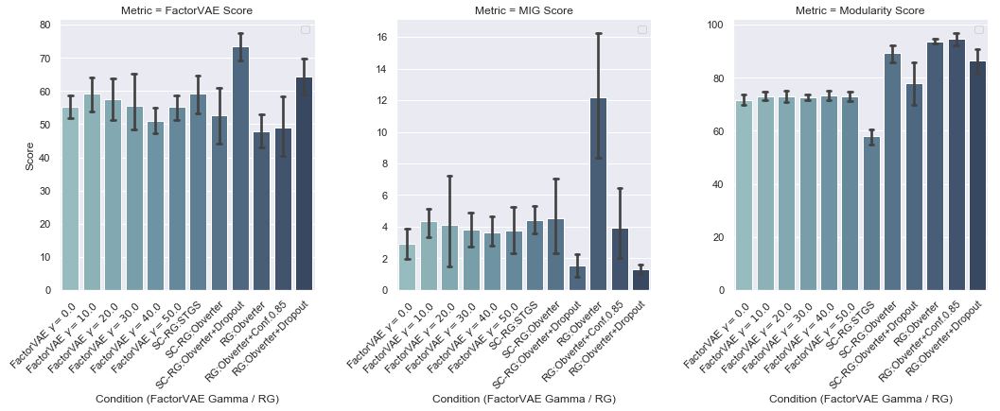

In [186]:
#%debug 

condition2epoch = {
    cond:{}
    for cond in condition_list
}

metrics=[
    "PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    "PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    "PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    "PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
]

# basis :
for cond in condition2epoch:
    if "FactorVAE" in cond:
        condition2epoch[cond] = {
            metric:4000#80
            for metric in metrics
        }
    elif "NLL" in cond:
        condition2epoch[cond] = {
            metric: 4000 #20
            for metric in metrics
        }
    else:
        condition2epoch[cond] = {
            metric: 4000 #200
            for metric in metrics
        }
        
print(condition2epoch)

to_rename = {
    "condition":"Condition (FactorVAE Gamma / RG)",
    "value":"Score",
    "metric":"Metric"
}
outputs_dict = filtered_boxplot_dict(combined_df,
    filtering_keys=[
        "PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        "PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        "PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        "PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        "PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        "PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        "PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    ], 
    logscale=False,
    ci='sd',
    kind='bar',
    err_style='band',
    linewidth=1,
    #style="factor",
    hue="condition",
    divider=[
        1.0, 
        0.01, 
        0.01, 
        
        1.0, 
        1.0,
        
        0.01, 
        0.01,
        0.01, 
        0.01],
    per_hue_epoch_filter=condition2epoch,
    to_replace={
        "PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        "PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        "PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        "PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        "PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        "PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        "PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        "PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        "PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        #
        "RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
        "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter+Conf.0.85",
        "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter+Dropout", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter+Dropout",
        "Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
    },
    to_rename=to_rename,
    #focus_quartile=0.97,
    box_plot_column='metric',
    #box_plot_row='factor',
    #show_sample_ratio=True,
    legend=False,
    palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    #palette=sns.color_palette("vlag"),#'Pastel1',
    #palette=sns.color_palette("ocean"),#'Pastel1',
    #palette=sns.color_palette("Spectral"),#'Pastel1',
    #palette=sns.color_palette("Blues"),#'Pastel1',
    #palette=sns.color_palette("Blues_d"),#'Pastel1',
    size=5.0,
    aspect=1.0,
    kwargs={
        "sharex":True,
        "sharey":False,
        "capsize":0.2,
        "order":[
            f'FactorVAE $\\gamma=0.0$',
            f'FactorVAE $\\gamma=10.0$',
            f'FactorVAE $\\gamma=20.0$',
            f'FactorVAE $\\gamma=30.0$',
            f'FactorVAE $\\gamma=40.0$',
            f'FactorVAE $\\gamma=50.0$',
            "SC-RG:STGS",
            "SC-RG:Obverter",
            "SC-RG:Obverter+Dropout",
            "RG:Obverter",
            "RG:Obverter+Conf.0.85",
            "RG:Obverter+Dropout",   
        ]
    }
)

for idx, ax in enumerate(outputs_dict['box_plot'].axes.reshape(-1).tolist()):
    startx, endx =ax.get_xlim()
    #sns.lineplot(x=[startx, endx], y=[0, 0], color='black', ax=ax, legend='brief' if idx==0 else False)
    #ax.axhline(100.0, ls='--')
    #ax.axhline(0, ls='--')
    #ax.set_ylim(bottom=0.0, top=1.0)
    ax.legend(loc='upper right')
    '''
    ax.tick_params(
        axis='x', 
        labelrotation=45, 
        ha="right",
        rotation_mode="anchor"
    )
    '''
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
    #plt.xticks(rotation=30)
    #ax.set_xticklabels(batch_sizes_n3)

    
#plt.savefig('./Baselines+Synth-Comp+NLLObverterDescr05Distr0-V1+V2+V2DP50+HingeObverterDistr7+HingeDescrDistr7Obverter-DisentanglementScores.png', dpi=1200)
plt.savefig('./Baselines+Synth-CompV1+NLLObverterDescr05Distr0-V2+V2DP50-DisentanglementScores.svg', dpi=1200)

In [187]:
def zs_compo_profile(
    df_runs, 
    filtering_keys, 
    logscale=False,
    ci=None,
    #err_style='band',
    err_style='bars',
    linewidth=2,
    hue="metric",
    style=None,
    nbr_epochs=-1,
    percentage=False,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    bottom = 0.0,
    top = 1.0,
    **kwargs):
    
    filtering = lambda df: df['metric'].isin(filtering_keys)
    filtered_df_run = df_runs[filtering(df_runs)]
    
    x_column = 'step'
    if show_timepoint:
        x_column = 'timepoint'
        
    test_keys = [k for k in filtering_keys if 'test' in k]
    train_keys = [k for k in filtering_keys if 'train' in k]
    comparing_test_train = (len(test_keys) * len(train_keys))
    if show_epoch and comparing_test_train:
        # Make sure that the graph are epoch-aligned, for easier comparaison:
        x_column = 'epoch'
        if nbr_epochs != -1:
            epoch_indices = range(nbr_epochs)
            epoch_filtering = lambda df: df['epoch'].isin(epoch_indices)
            filtered_df_run = filtered_df_run[epoch_filtering(filtered_df_run)]
        
    fig, ax_ps = plt.subplots()
    
    """
    if logscale:
        ax.set(yscale="log")
    
    if percentage:
        bottom = 0.0
        top = 100.0
    ax.set_ylim(bottom, top)
    
    if to_replace is not None:
        filtered_df_run.replace(to_replace=to_replace, inplace=True)
    
    estimator = None
    if ci is None: estimator = np.median
    
    g = sns.lineplot(
        x=x_column, 
        y="value",
        hue=hue,
        style=style,
        err_style=err_style,
        #err_style="bars", 
        ci=ci, #68
        data=filtered_df_run,
        ax=ax,
        linewidth=linewidth,
        estimator=estimator,
        **kwargs
    )
    """
    
    if comparing_test_train:
        ps = []
        x_column = "Training Accuracy (%)"
        y_column = "Zero-Shot Compositional Learning Test Accuracy (%)"
        
        for test_key, train_key in zip(test_keys, train_keys):
            df = filtered_df_run.copy()
            
            if hue == "metric":
                hue = None
                if 'exp' in df.keys():
                    run_d['exp'] = df.loc[df['metric'].isin([test_key]), 'exp'].values[:min_length]
                    hue = 'exp'

            #run_d = {'epoch':df.loc[df['metric'].isin([epoch_key]), 'epoch'].values}
            run_d = {}
            run_d[x_column] = df.loc[df['metric'].isin([train_key]), 'value'].values
            run_d[y_column] = df.loc[df['metric'].isin([test_key]), 'value'].values
            run_d[hue] = df.loc[df['metric'].isin([train_key]), hue]
            
            """
            if show_even_wrong_end_data:
                min_length = min(len(run_d['train']), len(run_d['test']))
                run_d['train'] = df.loc[df['metric'].isin([train_key]), 'value'].values[:min_length]
                run_d['test'] = df.loc[df['metric'].isin([test_key]), 'value'].values[:min_length]
            """
            
            
            run_df = pd.DataFrame(run_d)
            #run_df = pd.concat(run_d.values())
            
            #fig_ps, ax_ps = plt.subplots()
            
            if percentage:
                bottom = 0.0
                top = 100.0
            ax_ps.set_ylim(bottom, top)
            ax_ps.set_xlim(bottom, top)
            sns.lineplot(x=[bottom, top], y=[bottom, top], color='black', ax=ax_ps)    

            p = sns.lineplot(
                x=x_column, 
                y=y_column,
                hue=hue,
                style=None,
                err_style=err_style, #"bars", 
                ci=ci, #68
                data=run_df,
                ax=ax_ps,
                linewidth=linewidth
            )
            
            return p
        
            try:
                if hue is not None:
                    fig_ps, ax_ps = plt.subplots()

                    if percentage:
                        bottom = 0.0
                        top = 100.0
                    ax_ps.set_ylim(bottom, top)
                    ax_ps.set_xlim(bottom, top)
                    sns.lineplot(x=[bottom, top], y=[bottom, top], color='black', ax=ax_ps)

                    sns.kdeplot(data=run_df.loc[run_df['exp'].isin(['interweaved'])].train,
                         #x_column, 
                         data2=run_df.loc[run_df['exp'].isin(['interweaved'])].test,
                         #y_column,
                         #hue=hue,
                         #style=None,
                         #err_style=err_style, #"bars", 
                         #ci=ci, #68
                         kind='kde',
                         #data=run_df.loc[run_df['exp'].isin(['interweaved'])],
                         color='red',
                         ax=ax_ps,
                         alpha=0.5,
                         #shade=True
                         #linewidth=linewidth
                        )

                    sns.kdeplot(data=run_df.loc[run_df['exp'].isin(['splitted'])].train,
                         #x_column, 
                         data2=run_df.loc[run_df['exp'].isin(['splitted'])].test,
                         #y_column,
                         #hue=hue,
                         #style=None,
                         #err_style=err_style, #"bars", 
                         #ci=ci, #68
                         kind='kde',
                         #data=run_df.loc[run_df['exp'].isin(['splitted'])],
                         ax=ax_ps,
                         color='blue',
                         alpha=0.5,
                         #shade=True
                         #linewidth=linewidth
                        )

                    '''
                    fig_ps, ax_ps = plt.subplots()

                    bottom = 0.0
                    top = 1.0
                    if percentage:
                        bottom = 0.0
                        top = 100.0

                    ax_ps.set_ylim(bottom, top)
                    ax_ps.set_xlim(bottom, top)
                    sns.lineplot(x=[bottom, top], y=[bottom, top], color='black', ax=ax_ps)

                    sns.relplot(x=x_column, 
                         y=y_column,
                         hue=hue,
                         #style=None,
                         #err_style=err_style, #"bars", 
                         #ci=ci, #68
                         #kind='kde',
                         data=run_df,#run_df.loc[run_df['exp'].isin(['interweaved'])],
                         ax=ax_ps,
                         alpha=0.5,
                         #palette='muted',
                         #shade=True
                         #linewidth=linewidth
                        )
                    '''

                    p = multivariateGrid(col_x=x_column, 
                                         col_y=y_column, 
                                         col_k=hue, 
                                         df=run_df, 
                                         k_is_color=False, 
                                         scatter_alpha=.5,
                                         percentage=percentage)
            except Exception as e:
                    print(e)
            ps.append(p)
        if do_violin_plot:
            return g, ps, g_violin
        return g, ps
    else:
        if do_violin_plot:
            return g, g_violin
        return g

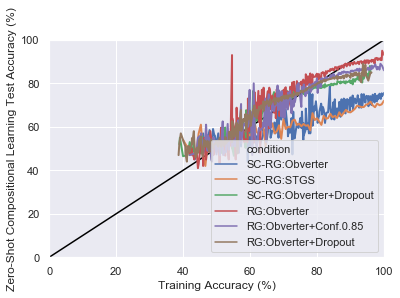

In [188]:
metrics = [
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]

to_replace={
    "RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
    "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter+Conf.0.85",
    "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter+Dropout", 
    "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter+Dropout",
    "Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
    "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
}

data_df = combined_df.replace(to_replace=to_replace, inplace=False)

g = zs_compo_profile(
    df_runs=data_df,
    filtering_keys=metrics, 
    logscale=False,
    ci=None,#"sd",
    err_style='band',
    #err_style='bars',
    linewidth=2,
    #hue="metric",
    hue="condition",
    #style="source",
    style=None,
    nbr_epochs=-1,
    percentage=True,
    to_replace=None,
    do_violin_plot=False,
    focus_quartile=None,
    #bottom = 0.0,
    #top = 1.0,
    
    legend=False,
    #palette=sns.cubehelix_palette(15, rot=-.25, light=.7),
    
)

plt.savefig('./SC-RG:STGS-Obverter+BN-+BN+DP-RG:Obverter+BN-+BN+DP-ZeroShotCompoLearningProfiles.svg', dpi=1200)

In [189]:
combined_df.condition

0                            FactorVAE $\gamma=0.0$
1                            FactorVAE $\gamma=0.0$
2                            FactorVAE $\gamma=0.0$
3                            FactorVAE $\gamma=0.0$
4                            FactorVAE $\gamma=0.0$
                             ...                   
1555505    RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter
1555506    RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter
1555507    RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter
1555508    RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter
1555509    RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter
Name: condition, Length: 5353475, dtype: object

In [190]:
combined_df.loc[
        combined_df.condition.isin([
            "RG:NLL-Descr0.5-Distr0+BN-Obverter",
            "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter", 
            "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter",
        ])
        & combined_df.metric.isin([
        "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",    
        "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    ])
].query("epoch==2000").describe()

,value,timepoint,step,epoch
count,35.000000,35.000000,35.0,35.0
mean,0.906571,711534.685714,2000.0,2000.0
std,0.153452,91688.479682,0.0,0.0
min,0.332000,663684.000000,2000.0,2000.0
25%,0.862500,663809.000000,2000.0,2000.0
50%,1.000000,663818.000000,2000.0,2000.0
75%,1.000000,697833.000000,2000.0,2000.0
max,1.000000,929922.000000,2000.0,2000.0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


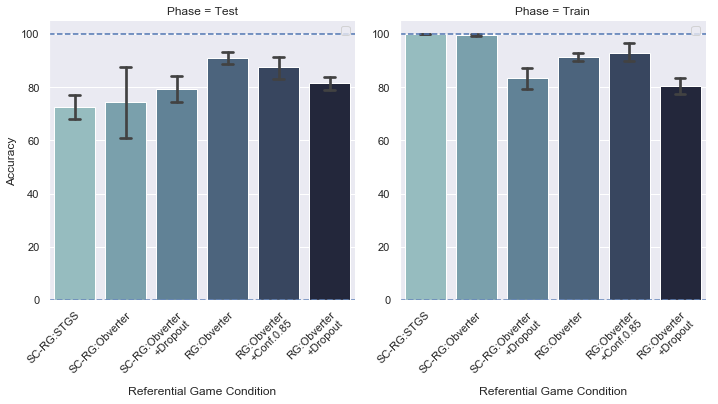

In [193]:
#%debug 
condition2epoch = {
    cond:{}
    for cond in condition_list
}
metrics=[
    #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
    'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
]

# basis :
for cond in condition2epoch:
    if "FactorVAE" in cond:
        condition2epoch[cond] = {
            metric: 4000 #80
            for metric in metrics
        }
    elif "NLL" in cond:
        condition2epoch[cond] = {
            metric: 4000 #20
            for metric in metrics
        }
    else:
        condition2epoch[cond] = {
            metric: 4000 #200
            for metric in metrics
        }
        
to_rename = {
    "condition":"Referential Game Condition",
    "value":"Accuracy",
    "metric":"Phase"
}
outputs_dict = filtered_boxplot_dict(
    #combined_df.loc[
    #    combined_df.condition.isin([
    #        "RG:NLL-Descr0.5-Distr0+BN-Obverter",
    #        "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter", 
    #        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter",
    #    ])
    #],
    combined_df.loc[
            combined_df.condition.isin([
                "RG:NLL-Descr0.5-Distr0+BN-Obverter",
                "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter",
                "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter", 
                "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter",
                "Synth. Comp. RG:NLL-Descr.0.5-STGS", 
                "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter",
            ])
            & combined_df.metric.isin([
            'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
            'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
        ])
    ].query("epoch==4000"),
    filtering_keys=[
        #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
    ], 
    logscale=False,
    ci='sd',
    kind='bar',
    err_style='band',
    linewidth=1,
    #style="factor",
    hue="condition",
    divider=[1.0, 1.0],
    per_hue_epoch_filter=condition2epoch,
    to_replace={
        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean':"Test", 
        'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean':"Train",
        #
        "RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
        "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter\n+Conf.0.85",
        "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter\n+Dropout", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter\n+Dropout",
        "Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
    },
    to_rename=to_rename,
    #focus_quartile=0.97,
    box_plot_column='metric',
    #box_plot_row='factor',
    #show_sample_ratio=True,
    legend=False,
    palette=sns.cubehelix_palette(6, rot=-.25, light=.7),
    #palette=sns.color_palette("vlag"),#'Pastel1',
    #palette=sns.color_palette("ocean"),#'Pastel1',
    #palette=sns.color_palette("Spectral"),#'Pastel1',
    #palette=sns.color_palette("Blues"),#'Pastel1',
    #palette=sns.color_palette("Blues_d"),#'Pastel1',
    size=5.0,
    aspect=1.0,
    kwargs={
        "sharex":True,
        "sharey":False,
        "capsize":0.2,
        "order":[
            #f'FactorVAE $\\gamma=0.0$',
            #f'FactorVAE $\\gamma=10.0$',
            #f'FactorVAE $\\gamma=20.0$',
            #f'FactorVAE $\\gamma=30.0$',
            #f'FactorVAE $\\gamma=40.0$',
            #f'FactorVAE $\\gamma=50.0$',
            "SC-RG:STGS",
            "SC-RG:Obverter",
            "SC-RG:Obverter\n+Dropout",
            "RG:Obverter",
            "RG:Obverter\n+Conf.0.85",
            "RG:Obverter\n+Dropout",   
        ]
    },
)

for idx, ax in enumerate(outputs_dict['box_plot'].axes.reshape(-1).tolist()):
    startx, endx =ax.get_xlim()
    #sns.lineplot(x=[startx, endx], y=[0, 0], color='black', ax=ax, legend='brief' if idx==0 else False)
    ax.axhline(100.0, ls='--')
    ax.axhline(0, ls='--')
    #ax.set_ylim(bottom=0.0, top=1.0)
    ax.legend(loc='upper right')
    """
    ax.tick_params(
        axis='x', 
        labelrotation=45, 
        ha="right",
        rotation_mode="anchor"
    )
    """
    plt.setp(
        ax.get_xticklabels(), 
        rotation=45, 
        ha="right",
        rotation_mode="anchor"
    )
    #plt.xticks(rotation=30)
    #ax.set_xticklabels(batch_sizes_n3)

    
#plt.savefig('./Baselines+Synth-Comp+NLLObverterDescr05Distr0-V1+V2+V2DP50+HingeObverterDistr7+HingeDescrDistr7Obverter-DisentanglementScores.png', dpi=1200)
plt.savefig('./Synth-CompV1+NLLObverterDescr05Distr0-V2+V2DP50-Systematicity.svg', dpi=1200)

No handles with labels found to put in legend.


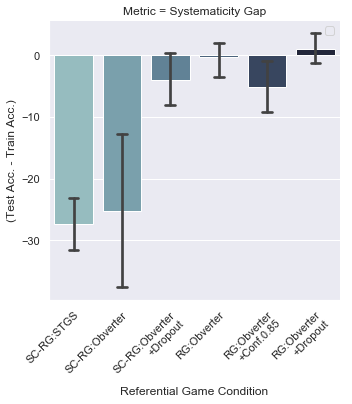

In [194]:
#%debug 
condition2epoch = {
    cond:{}
    for cond in condition_list
}
metrics=[
    #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    
    #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
    #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
    "Systematicity Gap"
]

# basis :
for cond in condition2epoch:
    if "FactorVAE" in cond:
        condition2epoch[cond] = {
            metric: 4000 #80
            for metric in metrics
        }
    elif "NLL" in cond:
        condition2epoch[cond] = {
            metric: 4000 #20
            for metric in metrics
        }
    else:
        condition2epoch[cond] = {
            metric: 4000 #200
            for metric in metrics
        }
        
to_rename = {
    "condition":"Referential Game Condition",
    "value":"(Test Acc. - Train Acc.)",
    "metric":"Metric"
}
outputs_dict = filtered_boxplot_dict(
    system_df,
    #combined_df.loc[
    #        combined_df.condition.isin([
    #            "RG:NLL-Descr0.5-Distr0+BN-Obverter",
    #            "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter", 
    #            "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter",
    #        ])
    #        & combined_df.metric.isin([
    #        'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
    #            'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean'
    #    ])
    #].query("epoch==4000"),
    filtering_keys=[
        #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        
        #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean',
        "Systematicity Gap",
    ], 
    logscale=False,
    ci='sd',
    kind='bar',
    err_style='band',
    linewidth=1,
    #style="factor",
    hue="condition",
    divider=[1.0, 1.0],
    per_hue_epoch_filter=condition2epoch,
    to_replace={
        #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        #
        #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean':"Test", 
        #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean':"Train",
        #
        "RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
        "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter\n+Conf.0.85",
        "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter\n+Dropout", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter\n+Dropout",
        "Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
        #
        "Systematicity":"Systematicity Gap",
    },
    to_rename=to_rename,
    #focus_quartile=0.97,
    box_plot_column='metric',
    #box_plot_row='factor',
    #show_sample_ratio=True,
    legend=False,
    palette=sns.cubehelix_palette(6, rot=-.25, light=.7),
    #palette=sns.color_palette("vlag"),#'Pastel1',
    #palette=sns.color_palette("ocean"),#'Pastel1',
    #palette=sns.color_palette("Spectral"),#'Pastel1',
    #palette=sns.color_palette("Blues"),#'Pastel1',
    #palette=sns.color_palette("Blues_d"),#'Pastel1',
    size=5.0,
    aspect=1.0,
    kwargs={
        "sharex":True,
        "sharey":False,
        "capsize":0.2,
        "order":[
            #f'FactorVAE $\\gamma=0.0$',
            #f'FactorVAE $\\gamma=10.0$',
            #f'FactorVAE $\\gamma=20.0$',
            #f'FactorVAE $\\gamma=30.0$',
            #f'FactorVAE $\\gamma=40.0$',
            #f'FactorVAE $\\gamma=50.0$',
            "SC-RG:STGS",
            "SC-RG:Obverter",
            "SC-RG:Obverter\n+Dropout",
            "RG:Obverter",
            "RG:Obverter\n+Conf.0.85",
            "RG:Obverter\n+Dropout",   
        ],
    }
)

for idx, ax in enumerate(outputs_dict['box_plot'].axes.reshape(-1).tolist()):
    startx, endx =ax.get_xlim()
    #sns.lineplot(x=[startx, endx], y=[0, 0], color='black', ax=ax, legend='brief' if idx==0 else False)
    #ax.axhline(100.0, ls='--')
    #ax.axhline(0, ls='--')
    #ax.set_ylim(bottom=0.0, top=1.0)
    ax.legend(loc='upper right')
    '''
    ax.tick_params(
        axis='x', 
        labelrotation=45, 
        ha="right",
        rotation_mode="anchor"
    )
    '''
    plt.setp(
        ax.get_xticklabels(), 
        rotation=45, 
        ha="right",
        rotation_mode="anchor"
    )
    #plt.xticks(rotation=30)
    #ax.set_xticklabels(batch_sizes_n3)

    
#plt.savefig('./Baselines+Synth-Comp+NLLObverterDescr05Distr0-V1+V2+V2DP50+HingeObverterDistr7+HingeDescrDistr7Obverter-DisentanglementScores.png', dpi=1200)
plt.savefig('./Synth-CompV1+NLLObverterDescr05Distr0-V2+V2DP50-Systematicity-Gap.svg', dpi=1200)

In [384]:
set(list(combined_df.metric))

{'PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/NonNullEntropy-MutualInformationGap/MIGScore',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore2',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/NonDiscrModularityScore1',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/NonDiscrModularityScore2',
 'PerEpoch/test/inst_coord_metric/IC',
 'PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean',
 'PerEpoch/test/l0_inst_coord_metric/IC',
 'PerEpoch/tes

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


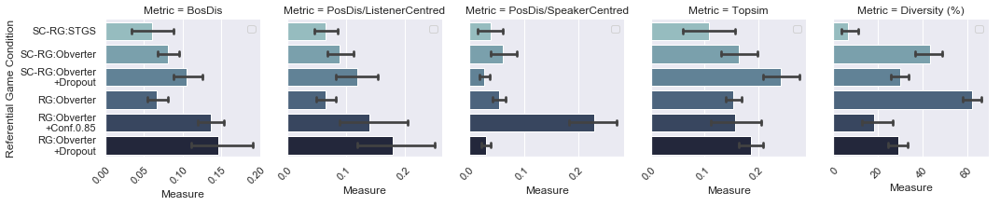

In [208]:
#%debug 
condition2epoch = {
    cond:{}
    for cond in condition_list
}
metrics=[
    #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
    #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    #
    #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
    #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean',
    #
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/',
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/',
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred',
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred',
    'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim',
    'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues',
    'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction',
    #'PerEpoch/test/l0_inst_coord_metric/IC',
    #
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/',
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/',
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred',
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred',
    'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim',
    'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues',
    'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction',
    #'PerEpoch/test/s0_inst_coord_metric/IC',
    'PerEpoch/test/inst_coord_metric/IC',
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
]

# basis :
for cond in condition2epoch:
    if "FactorVAE" in cond:
        condition2epoch[cond] = {
            metric:80
            for metric in metrics
        }
    elif "NLL" in cond:
        condition2epoch[cond] = {
            metric: 2000 if ("test" in metric and "Sentence" in metric) else 4000
            for metric in metrics
        }
    else:
        condition2epoch[cond] = {
            metric: 4000 #200
            for metric in metrics
        }
        
to_rename = {
    "condition":"Referential Game Condition",
    "value":"Measure",
    "metric":"Metric"
}
outputs_dict = filtered_boxplot_dict(
    #combined_df.loc[
    #    combined_df.condition.isin([
    #        "RG:NLL-Descr0.5-Distr0+BN-Obverter",
    #        "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter", 
    #        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter",
    #    ])
    #],
    combined_df.loc[
            combined_df.condition.isin([
                "RG:NLL-Descr0.5-Distr0+BN-Obverter",
                "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter",
                "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter", 
                "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter",
                "Synth. Comp. RG:NLL-Descr.0.5-STGS", 
                "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter",
            ])
    ],
    filtering_keys=[
        #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean", 
        #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
        #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
        #
        #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean', 
        #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean',
        #
        'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim',
        #'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues',
        'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction',
        'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred',
        'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred',
        'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/',
        #'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/',
        #
        #'PerEpoch/test/l0_inst_coord_metric/IC',
        #
        'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim',
        #'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues',
        'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction',
        'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred',
        'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred',
        'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/',
        #'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/',
        #
        #'PerEpoch/test/s0_inst_coord_metric/IC',
        #'PerEpoch/test/inst_coord_metric/IC',
        #'PerEpoch/train/inst_coord_metric/IC',
        #"PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
        #"PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
        #"PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean",
        #"PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean",
    ], 
    logscale=False,
    ci='sd',
    kind='bar',
    err_style='band',
    linewidth=1,
    #style="factor",
    hue="condition",
    divider=[
    # Topsim:
        100.0, 
    #    1.0,
        1.0, 
    # PosDis/BosDis:
        1.0,
        1.0, 
        1.0,
    #    1.0, 
    # Topsim:
        100.0, 
    #    1.0,
        1.0,
    # PosDis/BosDis:
        1.0,
        1.0, 
        1.0,
    #    1.0, 
    # ICs:
    #    1.0,
    #    1.0,
    # Sent. Lengths:
    #    1.0,
    #    1.0,
    #    1.0,
    #    1.0,
    ],
    per_hue_epoch_filter=condition2epoch,
    to_replace={
        #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
        #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
        #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
        #
        #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean':"Test", 
        #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean':"Train",
        #
        "RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
        "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter\n+Conf.0.85",
        "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter\n+Dropout", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter\n+Dropout",
        "Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
        "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
        #
        'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/':"BosDis",#/ListenerCentred",
        'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/':"BosDis/SpeakerCentred",
        'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred':"PosDis/ListenerCentred",
        'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred':"PosDis/SpeakerCentred",
        'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim':"Topsim",
        'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues':"Topsim/P-Values",
        'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction':"Diversity (%)",
        #'PerEpoch/test/l0_inst_coord_metric/IC':"Inst. Coord.",
        #
        'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/':"BosDis",#/ListenerCentred",
        'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/':"BosDis/SpeakerCentred",
        'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred':"PosDis/ListenerCentred",
        'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred':"PosDis/SpeakerCentred",
        'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim':"Topsim",
        'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues':"Topsim/P-Values",
        'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction':"Diversity (%)",
        #'PerEpoch/test/s0_inst_coord_metric/IC':"Inst. Coord.",
        'PerEpoch/test/inst_coord_metric/IC':"Inst. Coord. (Test)",
        'PerEpoch/train/inst_coord_metric/IC':"Inst. Coord. (Train)",
        "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean":"Sent. Length (Test)",
        "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean":"Sent. Length (Test)",
        "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean":"Sent. Length (Train)",
        "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean":"Sent. Length (Train)",
    },
    to_rename=to_rename,
    #focus_quartile=0.97,
    box_plot_column='metric',
    #box_plot_row='factor',
    #show_sample_ratio=True,
    legend=False,
    palette=sns.cubehelix_palette(6, rot=-.25, light=.7),
    #palette=sns.color_palette("vlag"),#'Pastel1',
    #palette=sns.color_palette("ocean"),#'Pastel1',
    #palette=sns.color_palette("Spectral"),#'Pastel1',
    #palette=sns.color_palette("Blues"),#'Pastel1',
    #palette=sns.color_palette("Blues_d"),#'Pastel1',
    size=3.0,
    aspect=1.0,
    #orient=None,
    orient="h",
    kwargs={
        #"sharex":True,
        #"sharey":False,
        "sharex":False,
        "sharey":True,
        "capsize":0.2,
        "order":[
            #f'FactorVAE $\\gamma=0.0$',
            #f'FactorVAE $\\gamma=10.0$',
            #f'FactorVAE $\\gamma=20.0$',
            #f'FactorVAE $\\gamma=30.0$',
            #f'FactorVAE $\\gamma=40.0$',
            #f'FactorVAE $\\gamma=50.0$',
            "SC-RG:STGS",
            "SC-RG:Obverter",
            "SC-RG:Obverter\n+Dropout",
            "RG:Obverter",
            "RG:Obverter\n+Conf.0.85",
            "RG:Obverter\n+Dropout",   
        ]
    }
)

for idx, ax in enumerate(outputs_dict['box_plot'].axes.reshape(-1).tolist()):
    startx, endx =ax.get_xlim()
    #sns.lineplot(x=[startx, endx], y=[0, 0], color='black', ax=ax, legend='brief' if idx==0 else False)
    #ax.axhline(100.0, ls='--')
    #ax.axhline(0, ls='--')
    #ax.set_ylim(bottom=0.0, top=1.0)
    ax.legend(loc='upper right')
    '''
    ax.tick_params(
        axis='x', 
        labelrotation=45, 
        ha="right",
        rotation_mode="anchor"
    )
    '''
    plt.setp(
        ax.get_xticklabels(), 
        rotation=45, 
        ha="right",
        rotation_mode="anchor",
        #fontsize='x-small'
    )
    
    #plt.xticks(rotation=30)
    #ax.set_xticklabels(batch_sizes_n3)

    
#plt.savefig('./Baselines+Synth-Comp+NLLObverterDescr05Distr0-V1+V2+V2DP50+HingeObverterDistr7+HingeDescrDistr7Obverter-DisentanglementScores.png', dpi=1200)
#plt.savefig('./Synth-CompV1+NLLObverterDescr05Distr0-V2+V2DP50-CompositionalityScores+Systematicity.svg', dpi=1200)
plt.savefig('./barplots-non-exh1-CompositionalityScores.svg', dpi=1200)

In [162]:
set(combined_df["metric"])

{'PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore',
 'PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/NonNullEntropy-MutualInformationGap/MIGScore',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore2',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/NonDiscrModularityScore1',
 'PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/NonDiscrModularityScore2',
 'PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean',
 'PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGSco

In [12]:
def make_spearman_correlation_matrix(
    intervention, 
    data_corr, 
    data_pv,
    metrics2tag,
    ax_corr=None,
    ax_pv=None,
    xticks=None,
    yticks=None,
    cbar_ax_corr=None,
    cbar_ax_pv=None,
    **kwargs
    ):
    
    fontsize = 8
    if "fontsize" in kwargs:
        fontsize = kwargs["fontsize"]
    
    mask = np.zeros_like(data_corr)
    mask[np.tril_indices_from(mask)] = True

    ax_corr = sns.heatmap(
        data_corr, 
        #mask=mask, 
        #cmap=sns.diverging_palette(220, 10, as_cmap=True), 
        #cmap=sns.color_palette("vlag"),
        cmap=sns.color_palette("icefire"),
        vmax=1.0, 
        vmin=-1.0,
        #center=0.0,
        square=True, 
        linewidths=.5, 
        #cbar_kws={"shrink": .5},
        annot_kws={"fontsize":fontsize},
        annot=True,
        ax=ax_corr,
        cbar_ax=cbar_ax_corr,
    )


    # We want to show all ticks...
    ax_corr.set_xticks(np.arange(data_corr.shape[0])+0.5)
    ax_corr.set_yticks(np.arange(data_corr.shape[0])+0.5)
    # ... and label them with the respective list entries
    ax_corr.set_xticklabels(xticks)
    ax_corr.set_yticklabels(yticks)

    # Rotate the tick labels and set their alignment.
    plt.setp(
        ax_corr.get_xticklabels(), 
        rotation=30, 
        ha="right",
        rotation_mode="anchor"
    )

    # Rotate the tick labels and set their alignment.
    plt.setp(
        ax_corr.get_yticklabels(), 
        rotation=0, 
        ha="right",
        rotation_mode="anchor"
    )

    """
    for i in range(spearman_corr.shape[1]):
        for j in range(spearman_corr.shape[1]):
            text = ax.text(j+0.5, i+0.5, '%.2f'%(spearman_corr[i, j]),
                           ha="center", va="center", color="black")
    """

    ax_corr.set_title(f"Spearman Correlations - {intervention}")

    mask = np.zeros_like(data_pv)
    mask[np.tril_indices_from(mask)] = True
    
    ax_pv = sns.heatmap(
        data_pv, 
        #mask=mask, 
        #cmap=sns.diverging_palette(220, 10, as_cmap=True), 
        cmap=sns.color_palette("vlag"),
        #cmap=sns.color_palette("Blues"),
        #vmax=1.0, 
        vmax=0.3, 
        #center=0.0,
        annot=True,
        square=True, 
        #linewidths=.5, 
        #cbar_kws={"shrink": .5},
        annot_kws={"fontsize":fontsize},
        ax=ax_pv,
        cbar_ax=cbar_ax_pv,
    )


    # We want to show all ticks...
    ax_pv.set_xticks(np.arange(data_pv.shape[0])+0.5)
    ax_pv.set_yticks(np.arange(data_pv.shape[0])+0.5)
    # ... and label them with the respective list entries
    ax_pv.set_xticklabels(metrics2tag.keys())
    ax_pv.set_yticklabels(metrics2tag.keys())

    # Rotate the tick labels and set their alignment.
    plt.setp(
        ax_pv.get_xticklabels(), 
        rotation=30, 
        ha="right",
        rotation_mode="anchor"
    )

    # Rotate the tick labels and set their alignment.
    plt.setp(
        ax_pv.get_yticklabels(), 
        rotation=0, 
        ha="right",
        rotation_mode="anchor"
    )

    """
    for i in range(spearman_corr.shape[1]):
        for j in range(spearman_corr.shape[1]):
            text = ax.text(j+0.5, i+0.5, '%.2f'%(spearman_corr[i, j]),
                           ha="center", va="center", color="black")
    """

    ax_pv.set_title(f"Spearman P-Values - {intervention}")

    return ax_corr, ax_pv

In [13]:
def compute_spearman_correlation_matrix(
    intervention,
    data_df,
    metrics2tag=None,
    metrics2epoch=None,
    to_replace=None,
    **kwargs
    ):
    
    if metrics2tag is None:
        metrics2tag = {
            "FactorVAE Score":"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean",
            "Modularity Score":"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
            "MIG Score":"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
            "Toposim":"PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim",
            "PosDis/ListenerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred",
            "PosDis/SpeakerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred",
            "BosDis/ListenerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/",
            "BosDis/SpeakerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/",
            "Inst. Coordination":"test/IC",
            "Test Accuracy":"PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean",
            "Train Accuracy":"PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean",
            #"Systematicity Gap":"Systematicity Gap",
        }
    
    if metrics2epoch is None:
        metrics2epoch = {
            "FactorVAE Score": [4000],
            "Modularity Score": [4000],
            "MIG Score": [4000],
            "Toposim": [4000],
            "PosDis/ListenerCentred": [4000],
            "PosDis/SpeakerCentred": [4000],
            "BosDis/ListenerCentred": [4000],
            "BosDis/SpeakerCentred": [4000],
            "Inst. Coordination":[4000],
            "Test Accuracy": [4000],
            "Train Accuracy": [4000],
            #"Systematicity Gap": [4000],
        }
    
    if to_replace is None:
        to_replace = {
            'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
            'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
        }
    
    metric2df = {}
    for metric,tag in metrics2tag.items():
        metric2df[metric] = data_df.reset_index(inplace=False, drop=True)

        """
        metric2df[metric].loc[metric2df[metric].metric.isin([list(to_replace.keys())[0]]), "epoch"] *= 2
        metric2df[metric].loc[metric2df[metric].metric.isin([list(to_replace.keys())[1]]), "epoch"] *= 2
        metric2df[metric].loc[metric2df[metric].metric.isin([list(to_replace.keys())[1]]), "epoch"] += 1
        """
        
        #metric2df[metric] = metric2df[metric].replace(to_replace=to_replace, inplace=False)
        metric2df[metric] = metric2df[metric].query(f"metric=='{tag}'")
        metric2df[metric] = metric2df[metric].replace(to_replace=to_replace, inplace=False)
        
        if metric in metrics2epoch:
            filtering = lambda df: df['epoch'].isin(metrics2epoch[metric])
            metric2df[metric] = metric2df[metric][filtering(metric2df[metric])]
        
    spearman_corr = np.zeros((len(metrics2tag),len(metrics2tag)))
    spearman_pv = np.zeros((len(metrics2tag),len(metrics2tag)))

    for id1, m1 in enumerate(metrics2tag.keys()):
        for id2, m2 in enumerate(metrics2tag.keys()):
            if True:#bs1!=bs2:
                corr, pv = stats.spearmanr(
                    metric2df[m1].value,
                    metric2df[m2].value
                )
                spearman_corr[id1, id2] = corr
                spearman_pv[id1, id2] = pv
    
    ticklabels = metrics2tag.keys()
    
    return spearman_corr, spearman_pv, ticklabels, metric2df

In [14]:
def compute_make_spearman_correlation_matrix(
    intervention,
    data_df,
    metrics2tag=None,
    metrics2epoch=None,
    to_replace=None,
    fig=None,
    ax_corr=None,
    ax_pv=None,
    cbar_ax_corr=None,
    cbar_ax_pv=None,
    **kwargs
    ):
    
    data_corr, data_pv, \
    ticklabels, metric2df = compute_spearman_correlation_matrix(
        intervention=intervention,
        data_df=data_df,
        metrics2tag=metrics2tag,
        metrics2epoch=metrics2epoch,
        to_replace=to_replace,
        **kwargs
    )
    
    if fig is None:
        figsize=(100,50)
        if "figsize" in kwargs:
            figsize = kwargs["figsize"]
        fig, (ax_corr, ax_pv) = plt.subplots(
            2,
            1,
            sharey=True, 
            sharex=True,
            figsize=figsize
        )

    ax_corr, ax_pv = make_spearman_correlation_matrix(
        intervention=intervention, 
        data_corr=data_corr, 
        data_pv=data_pv,
        metrics2tag=metrics2tag,
        ax_corr=ax_corr,
        ax_pv=ax_pv,
        xticks=ticklabels,
        yticks=ticklabels,
        cbar_ax_corr=cbar_ax_corr,
        cbar_ax_pv=cbar_ax_pv,
        **kwargs
    )
    
    return (ax_corr, ax_pv), data_corr, data_pv, metric2df

AttributeError: 'NoneType' object has no attribute 'keys'

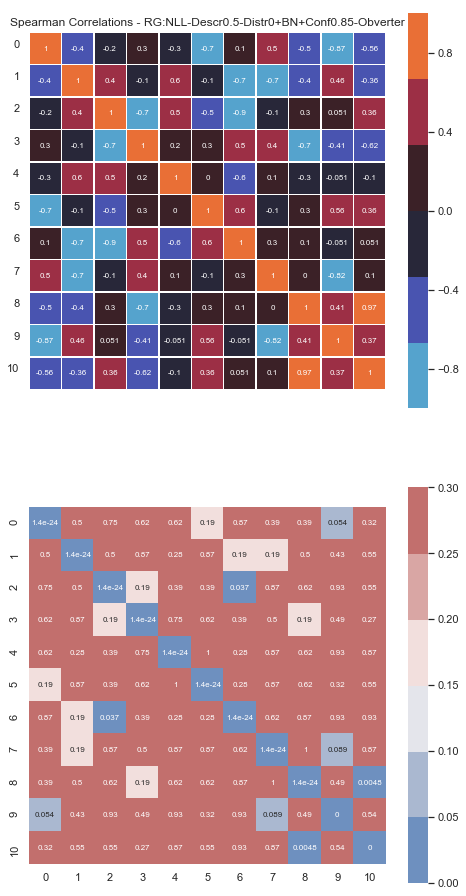

In [219]:
axes = compute_make_spearman_correlation_matrix(
    intervention=intervention,
    data_df=df_runs_dict[intervention],
    fontsize=8,
    figsize=(8,16)
)

In [15]:
def make_spearman_correlation_matrix_through_time(
    intervention,
    data_df,
    metrics2epoch=None,
    metrics2tag=None,
    to_replace=None,
    nbr_timestep=8,
    fontsize=8,
    figsize_basis=8,
    figsize=None,
    ncols=None,
    verbose=False,
    **kwargs
    ):
    
    
    if ncols is None:
        ncols = nbr_timestep
    nrows = 2*(nbr_timestep//ncols)
    
    #figsize = (figsize_basis*nbr_timestep, figsize_basis*2)
    #figsize = (figsize_basis*nrows, figsize_basis*ncols)
    if figsize is None:
        figsize = (figsize_basis*nrows//4, figsize_basis*ncols)
    
    fig, axes = plt.subplots(
        nrows, #2
        ncols, #nbr_timestep,
        sharey=True, 
        sharex=True,
        figsize=figsize
    )
    
    # TODO: set up the cbars...
    cbar_ax_corr = fig.add_axes([.91, .55, .03*2.0/nbr_timestep, .3])
    cbar_ax_pv = fig.add_axes([.91, .15, .03*2.0/nbr_timestep, .3])

    if metrics2tag is None:
        metrics2tag = {
            "FactorVAE Score":"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean",
            "Modularity Score":"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
            "MIG Score":"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
            "Toposim":"PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim",
            "PosDis/ListenerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred",
            "PosDis/SpeakerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred",
            "BosDis/ListenerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/",
            "BosDis/SpeakerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/",
            "Inst. Coordination":"test/IC",
            "Test Accuracy":"PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean",
            "Train Accuracy":"PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean",
            "Systematicity Gap":"Systematicity Gap",
        }
    
    if metrics2epoch is None:
        metrics2epoch = {
            "FactorVAE Score": [i*200 for i in range(1,21)],
            "Modularity Score": [i*200 for i in range(1,21)],
            "MIG Score": [i*200 for i in range(1,21)],
            "Toposim": [i*200 for i in range(1,21)],
            "PosDis/ListenerCentred": [i*200 for i in range(1,21)],
            "PosDis/SpeakerCentred": [i*200 for i in range(1,21)],
            "BosDis/ListenerCentred": [i*200 for i in range(1,21)],
            "BosDis/SpeakerCentred": [i*200 for i in range(1,21)],
            "Inst. Coordination":[i*200 for i in range(1,21)],
            "Test Accuracy": [i*200 for i in range(1,21)],
            "Train Accuracy": [i*200 for i in range(1,21)],
            "Systematicity Gap": [i*200 for i in range(1,21)],
        }
    
    if to_replace is None:
        to_replace = {
            'PerEpoch/test/l0_inst_coord_metric/IC':"test/IC",
            'PerEpoch/test/s0_inst_coord_metric/IC':"test/IC",
        }
    
    list_metrics2tag = [metrics2tag]*nbr_timestep
    list_metrics2epoch = []
    epochs = []
    for tidx in range(nbr_timestep):
        m2e = {}
        if tidx==0:
            for key, epoch_indices in metrics2epoch.items():
                m2e[key] = [epoch_indices[0]] 
        elif tidx==(nbr_timestep-1):
            for key, epoch_indices in metrics2epoch.items():
                m2e[key] = [epoch_indices[-1]] 
        else:
            for key, epoch_indices in metrics2epoch.items():
                nbr_values = len(epoch_indices)
                inc = (nbr_values-2) // (nbr_timestep-2)
                m2e[key] = [epoch_indices[inc*tidx]] 
                if verbose:
                    print(key,m2e[key])
        list_metrics2epoch.append(m2e)
        epochs.append(m2e[key])
    
    data_corrs = []
    data_pvs = []
    metric2dfs = {}
    
    for tidx in tqdm(range(nbr_timestep)):
        rowidx = tidx//ncols
        colidx = tidx%ncols
        
        ax_corr_pv, dcorr, \
        dpv, m2df = compute_make_spearman_correlation_matrix(
            intervention+f" @ Epoch={epochs[tidx][0]}",
            data_df,
            metrics2tag=list_metrics2tag[tidx],
            metrics2epoch=list_metrics2epoch[tidx],
            to_replace=to_replace,
            fig=fig,
            #ax_corr=axes[0][tidx],
            #ax_pv=axes[1][tidx],
            ax_corr=axes[2*rowidx][colidx],
            ax_pv=axes[2*rowidx+1][colidx],
            cbar_ax_corr=cbar_ax_corr,
            cbar_ax_pv=cbar_ax_pv,
            #cbar_ax_corr=axes[0][-1],
            #cbar_ax_pv=axes[1][-1],
            **kwargs
        )
        data_corrs.append(dcorr)
        data_pvs.append(dpv)
        metric2dfs[epochs[tidx][0]] = m2df
        
    return axes, data_corrs, data_pvs, metric2dfs

In [16]:
axes = {}
data_corrs = {}
data_pvs = {}
int2ep2metric2dfs = {}

In [17]:
init_path = '/scratch/staff/kyd500/development/MineRL/ReferentialGym/zoo/referential-games+compositionality+disentanglement/fromDesktop/'
intervention = "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter"

In [18]:
system_df.query("epoch==4000")

,step,source,epoch,metric,condition,factor,value
200000,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,-1.229164
200001,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,-3.666664
200002,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,7.020836
200003,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,-1.229164
200004,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,2.375000
200005,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,1.812500
200006,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,-4.229164
200007,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,0.145836
200008,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,-2.833336
200009,4000,/scratch/staff/kyd500/development/MineRL/Refer...,4000,Systematicity Gap,RG:NLL-Descr0.5-Distr0+BN-Obverter,0.0,2.854164



  0%|          | 0/5 [00:00<?, ?it/s]/scratch/staff/kyd500/development/MineRL/venv/lib/python3.6/site-packages/ipykernel_launcher.py:70: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

100%|██████████| 20/20 [11:09<00:00, 33.46s/it]

100%|██████████| 20/20 [04:27<00:00, 13.38s/it][A

100%|██████████| 20/20 [11:27<00:00, 34.36s/it][A

100%|██████████| 20/20 [04:26<00:00, 13.34s/it][A

100%|██████████| 20/20 [04:14<00:00, 12.72s/it][A

100%|██████████| 5/5 [36:46<00:00, 441.36s/it]


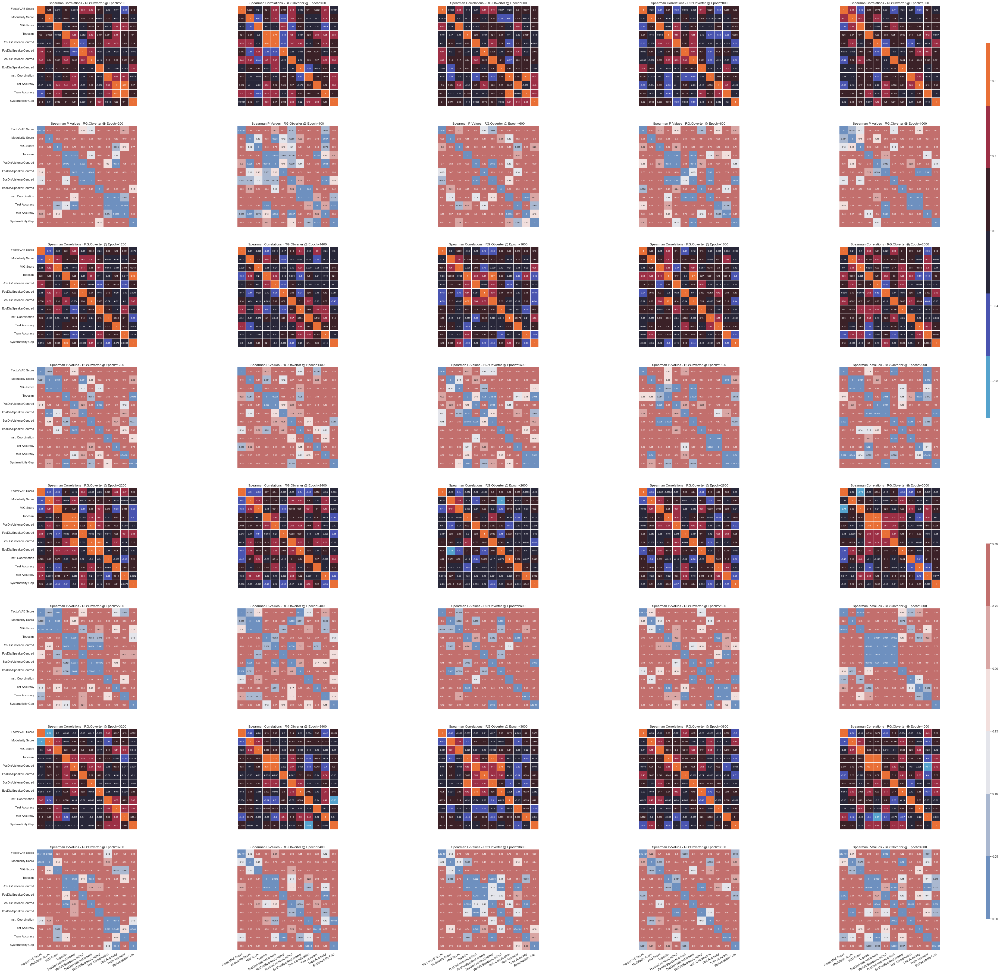

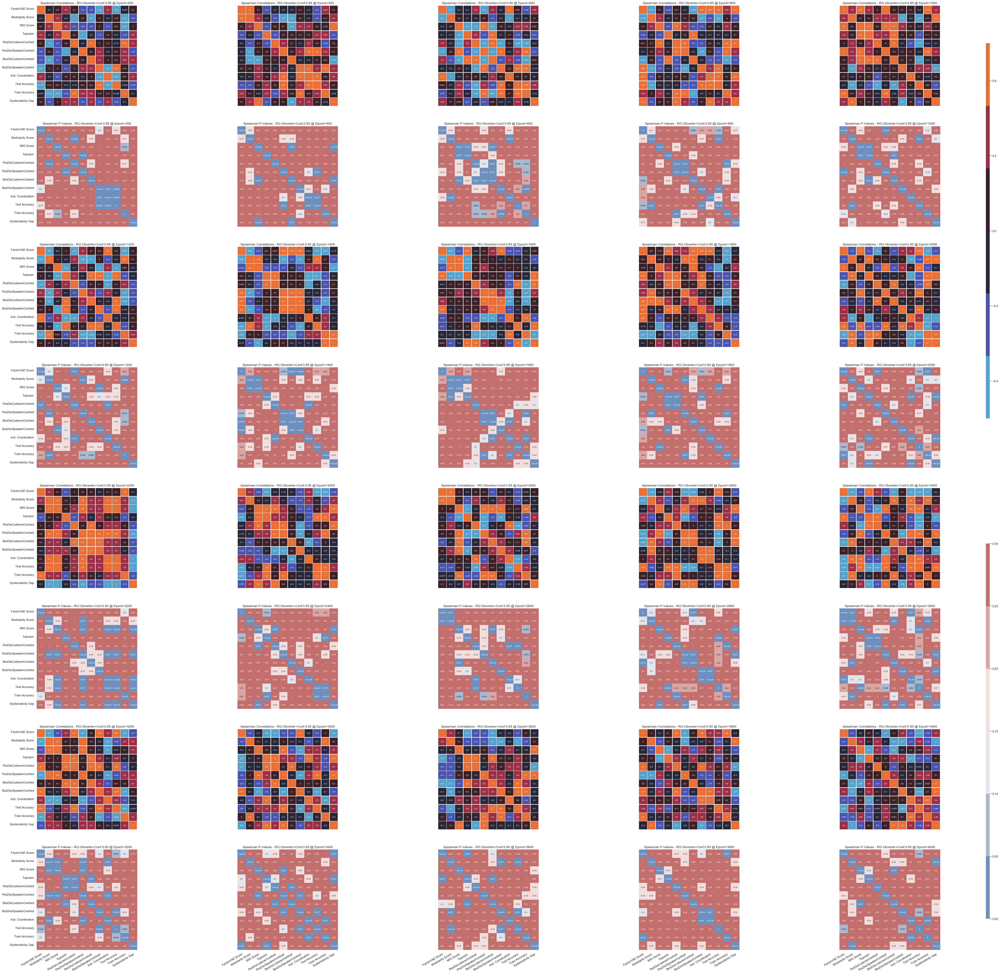

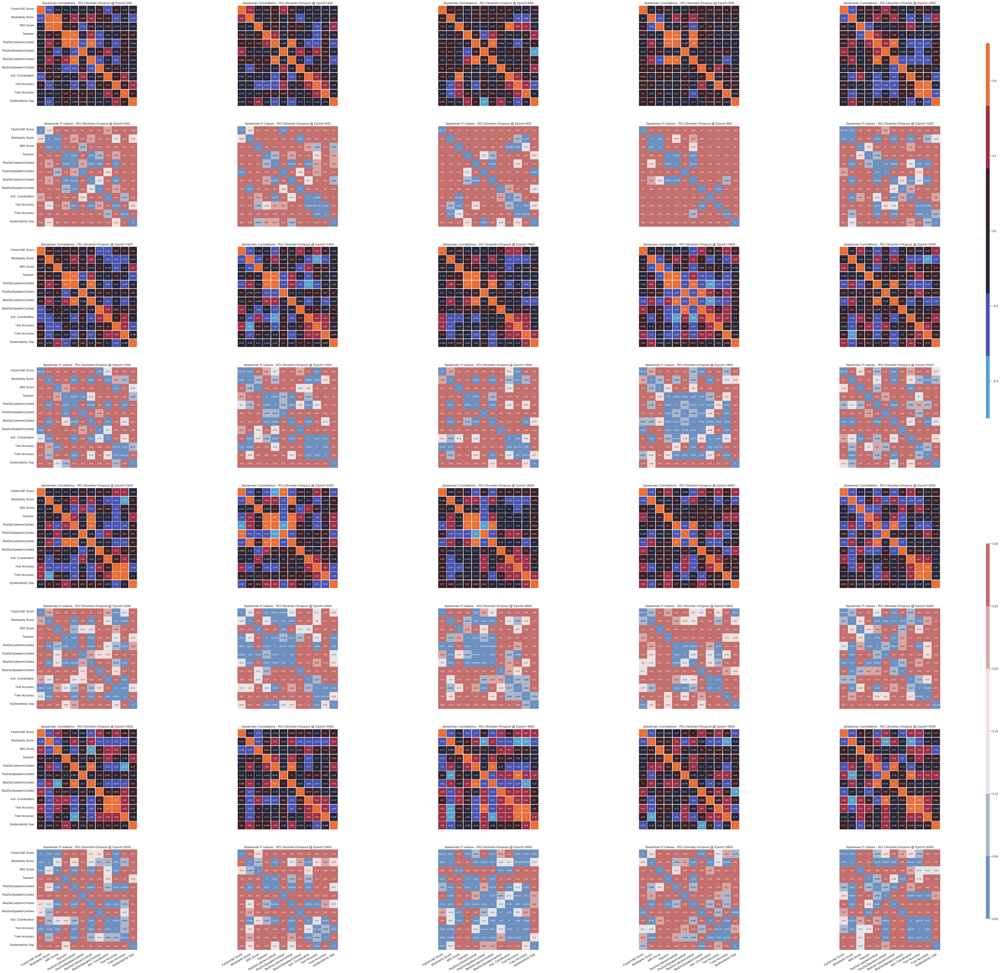

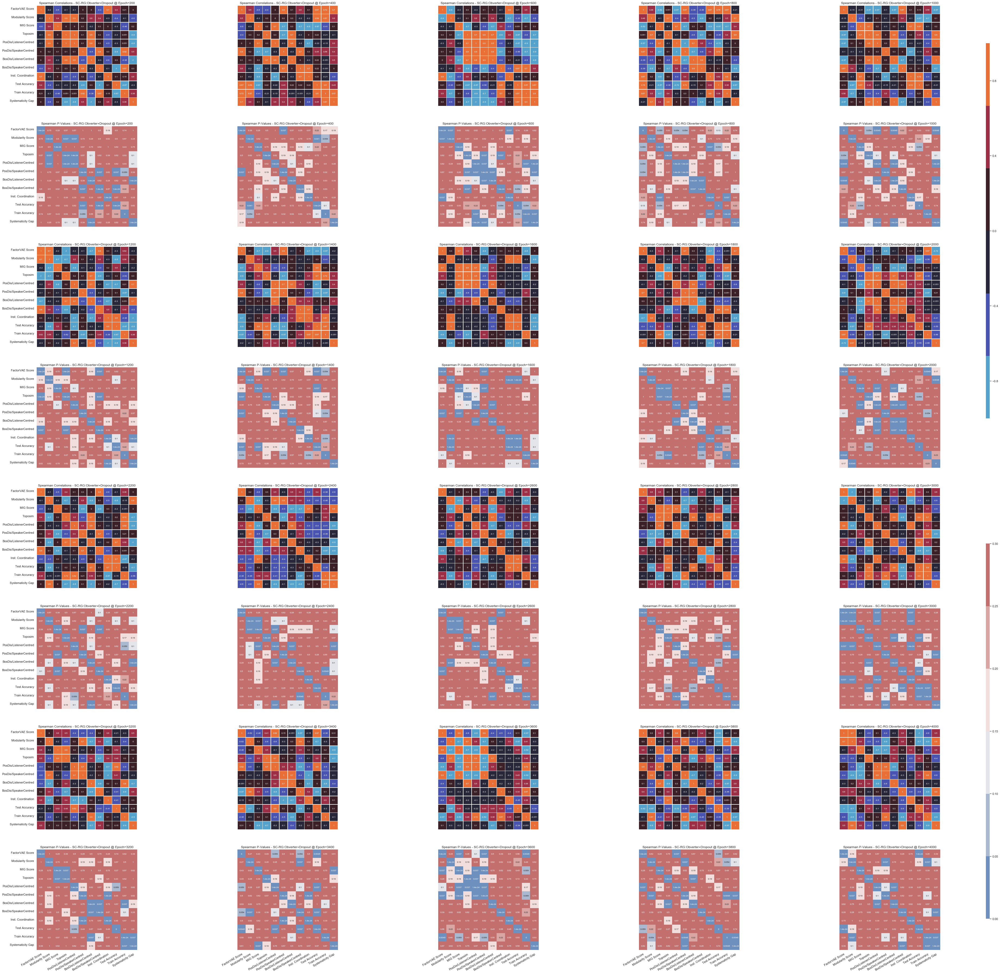

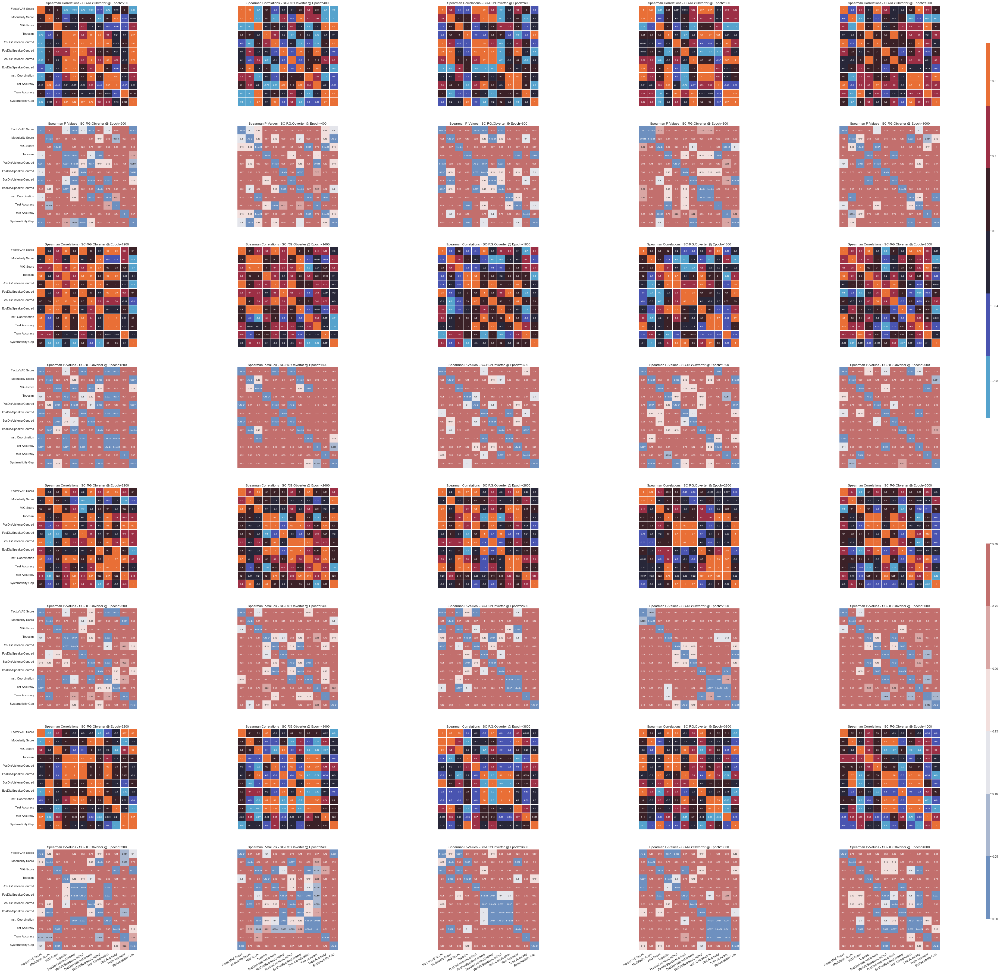

In [260]:
#%debug

to_replace={
    #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
    #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
    #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
    #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
    #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
    #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
    #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
    #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
    #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
    #
    #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean':"Test", 
    #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean':"Train",
    #
    
    "RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
    "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter+Conf.0.85",
    "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter+Dropout", 
    "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter+Dropout",
    #"Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
    "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
    #
#     'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/':"BosDis",#/ListenerCentred",
#     'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/':"BosDis/SpeakerCentred",
#     'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred':"PosDis/ListenerCentred",
#     'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred':"PosDis/SpeakerCentred",
#     'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim':"Topsim",
#     'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues':"Topsim/P-Values",
#     'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction':"Diversity (%)",
#     #'PerEpoch/test/l0_inst_coord_metric/IC':"Inst. Coord.",
#     #
#     'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/':"BosDis",#/ListenerCentred",
#     'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/':"BosDis/SpeakerCentred",
#     'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred':"PosDis/ListenerCentred",
#     'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred':"PosDis/SpeakerCentred",
#     'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim':"Topsim",
#     'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues':"Topsim/P-Values",
#     'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction':"Diversity (%)",
#     #'PerEpoch/test/s0_inst_coord_metric/IC':"Inst. Coord.",
#     'PerEpoch/test/inst_coord_metric/IC':"Inst. Coord. (Test)",
#     'PerEpoch/train/inst_coord_metric/IC':"Inst. Coord. (Train)",
#     "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean":"Sent. Length (Test)",
#     "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean":"Sent. Length (Test)",
#     "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean":"Sent. Length (Train)",
#     "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean":"Sent. Length (Train)",
}

metrics2tag = {
    "FactorVAE Score":"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean",
    "Modularity Score":"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    "MIG Score":"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "Toposim":"PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim",
    "PosDis/ListenerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred",
    "PosDis/SpeakerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred",
    "BosDis/ListenerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/",
    "BosDis/SpeakerCentred":"PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/",
    "Inst. Coordination":"test/IC",
    "Test Accuracy":"PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean",
    "Train Accuracy":"PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean",
    "Systematicity Gap":"Systematicity Gap",
}

nbr_timestep = 20
ncols = 5
scale = 4

for intervention in tqdm(to_replace.keys(),position=1):
    data_df = pd.concat([combined_df.query(f"condition=='{intervention}'"), system_df.query(f"condition=='{intervention}'")])
    data_df = data_df.replace(to_replace=to_replace, inplace=False)


    axes[intervention], data_corrs[intervention], \
    data_pvs[intervention], m2dfs[intervention] = make_spearman_correlation_matrix_through_time(
        intervention=to_replace[intervention],
        data_df=data_df,
        nbr_timestep=nbr_timestep,
        to_replace=None,
        metrics2tag=metrics2tag,
        fontsize=8,
        figsize_basis=16,
        figsize=(scale*16, scale*16),
        ncols=ncols,
        verbose=False,
    )

    #plt.savefig(f'./RG-{intervention}-SpearmanCorrelations-Through{nbr_timestep}Time.png', dpi=300)
    plt.savefig(f'./RG-{intervention}-SpearmanCorrelations-Through{nbr_timestep}TimeOver{ncols}Cols-WithSystematicity.svg', dpi=300)


  0%|          | 0/5 [00:00<?, ?it/s]/scratch/staff/kyd500/development/MineRL/venv/lib/python3.6/site-packages/ipykernel_launcher.py:97: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

100%|██████████| 20/20 [04:50<00:00, 14.54s/it]

100%|██████████| 20/20 [03:36<00:00, 10.81s/it][A

100%|██████████| 20/20 [04:55<00:00, 14.78s/it][A

100%|██████████| 20/20 [03:42<00:00, 11.11s/it][A

100%|██████████| 20/20 [03:38<00:00, 10.94s/it][A

100%|██████████| 5/5 [22:24<00:00, 268.85s/it]


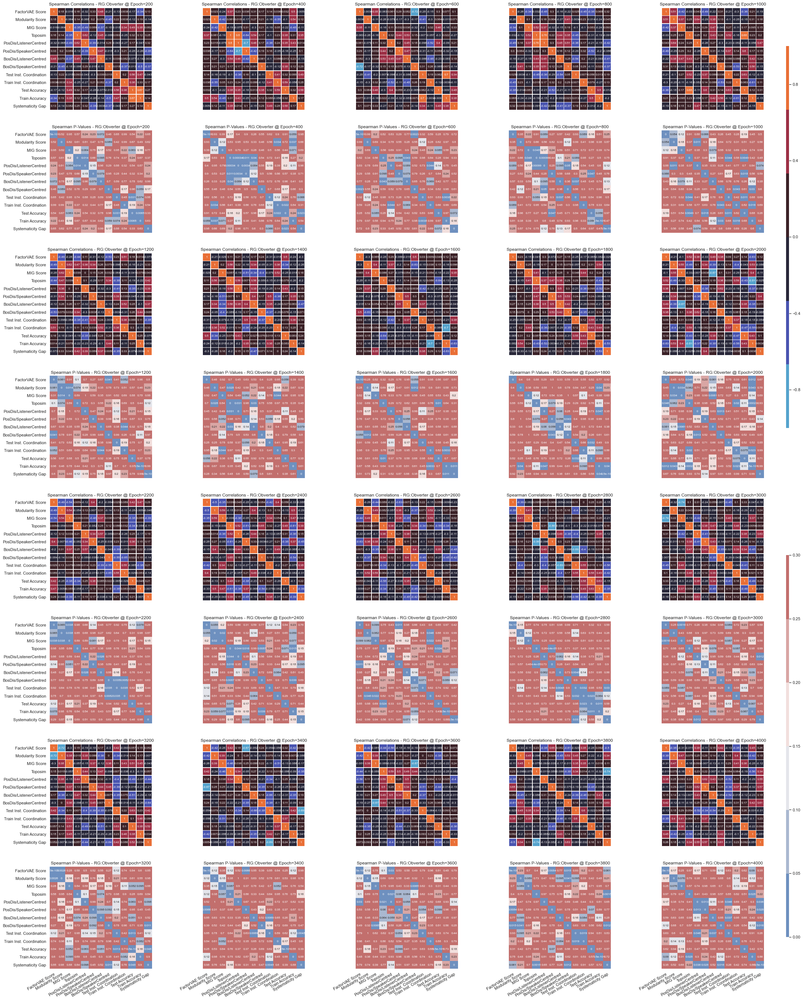

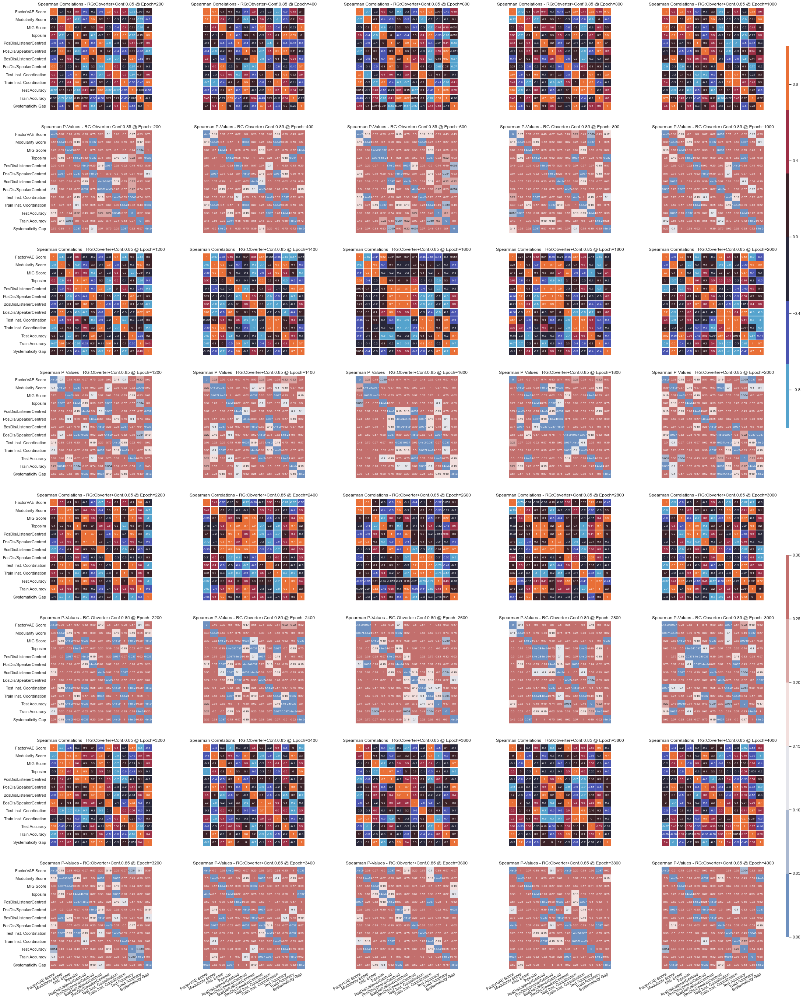

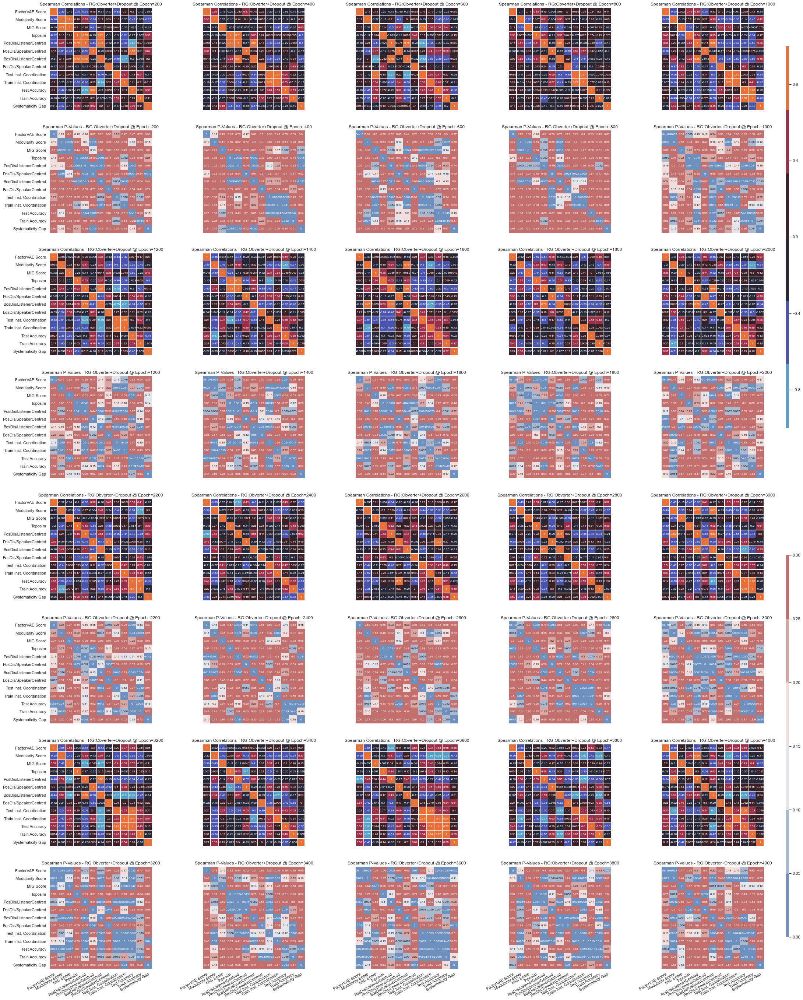

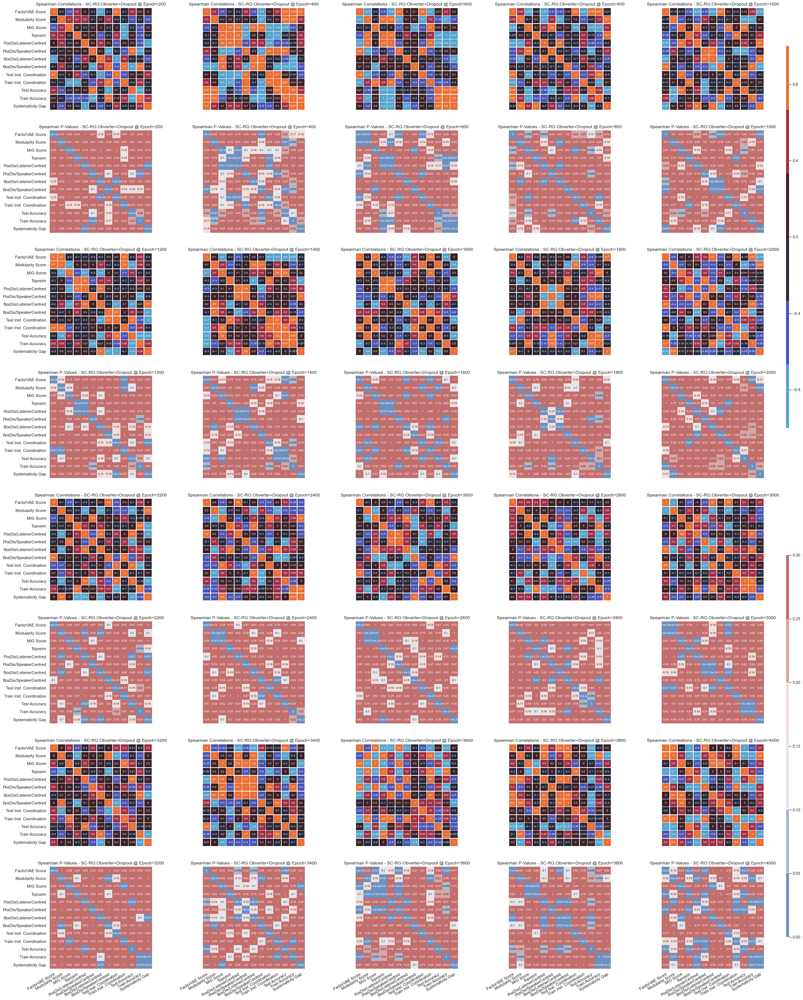

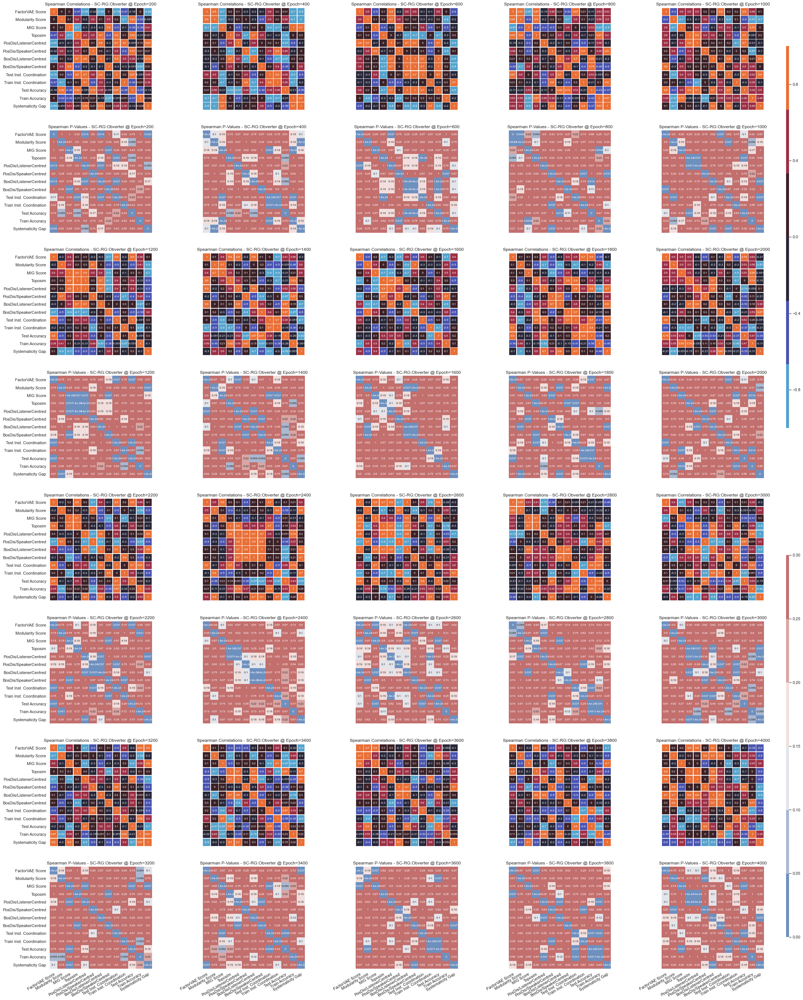

In [30]:
#%debug

to_replace={
    #"PerEpoch/test/baseline_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
    #"PerEpoch/test/baseline_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
    #"PerEpoch/test/baseline_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
    #"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
    #"PerEpoch/test/s0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean":"FactorVAE Score", 
    #"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
    #"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
    #"PerEpoch/test/s0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore":"MIG Score",
    #"PerEpoch/test/s0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1":"Modularity Score",
    #
    #'PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean':"Test", 
    #'PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean':"Train",
    #
    
    "RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
    "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter+Conf.0.85",
    "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter+Dropout", 
    "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter+Dropout",
    "Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
    "Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
    #
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/':"BosDis",#/ListenerCentred",
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/':"BosDis/SpeakerCentred",
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred':"PosDis/ListenerCentred",
    'PerEpoch/test/l0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred':"PosDis/SpeakerCentred",
    'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim':"Topsim",
    'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues':"Topsim/P-Values",
    'PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction':"Diversity (%)",
    #'PerEpoch/test/l0_inst_coord_metric/IC':"Inst. Coord.",
    #
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/':"BosDis",#/ListenerCentred",
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/':"BosDis/SpeakerCentred",
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred':"PosDis/ListenerCentred",
    'PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred':"PosDis/SpeakerCentred",
    'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim':"Topsim",
    'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/PValues':"Topsim/P-Values",
    'PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/NonAmbiguousProduction':"Diversity (%)",
    #'PerEpoch/test/s0_inst_coord_metric/IC':"Inst. Coord.",
    'PerEpoch/test/inst_coord_metric/IC':"Test Inst. Coord.",
    'PerEpoch/train/inst_coord_metric/IC':"Train Inst. Coord.",
    "PerEpoch/test/repetition0/comm_round0/l0/SentenceLength__/10_/Mean":"Sent. Length (Test)",
    "PerEpoch/test/repetition0/comm_round0/s0/SentenceLength__/10_/Mean":"Sent. Length (Test)",
    "PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Mean":"Sent. Length (Train)",
    "PerEpoch/train/repetition0/comm_round0/s0/SentenceLength__/10_/Mean":"Sent. Length (Train)",
}

metrics2tag = {
    "FactorVAE Score":"PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean",
    "Modularity Score":"PerEpoch/test/l0_modularity_disentanglement_metric/DisentanglementMetric/Modularity/ModularityScore1",
    "MIG Score":"PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/MIGScore",
    "Toposim":"PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim",
    "PosDis/ListenerCentred":"PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/ListenerCentred",
    "PosDis/SpeakerCentred":"PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred",
    "BosDis/ListenerCentred":"PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/ListenerCentred/",
    "BosDis/SpeakerCentred":"PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/",
    #"Inst. Coordination":"test/IC",
    "Test Inst. Coordination":"PerEpoch/test/inst_coord_metric/IC",
    "Train Inst. Coordination":"PerEpoch/train/inst_coord_metric/IC",
    "Test Accuracy":"PerEpoch/test/repetition0/comm_round0/referential_game_accuracy/Mean",
    "Train Accuracy":"PerEpoch/train/repetition0/comm_round0/referential_game_accuracy/Mean",
    "Systematicity Gap":"Systematicity Gap",
}

metrics2epoch = {
    "FactorVAE Score": [i*200 for i in range(1,21)],
    "Modularity Score": [i*200 for i in range(1,21)],
    "MIG Score": [i*200 for i in range(1,21)],
    "Toposim": [i*200 for i in range(1,21)],
    "PosDis/ListenerCentred": [i*200 for i in range(1,21)],
    "PosDis/SpeakerCentred": [i*200 for i in range(1,21)],
    "BosDis/ListenerCentred": [i*200 for i in range(1,21)],
    "BosDis/SpeakerCentred": [i*200 for i in range(1,21)],
    "Test Inst. Coordination":[i*200 for i in range(1,21)],
    "Train Inst. Coordination":[i*200 for i in range(1,21)],
    "Test Accuracy": [i*200 for i in range(1,21)],
    "Train Accuracy": [i*200 for i in range(1,21)],
    "Systematicity Gap": [i*200 for i in range(1,21)],
}

ints = {
    #"RG:NLL-Descr0.5-Distr0+BN-Obverter":"RG:Obverter",
    #"RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter":"RG:Obverter+Conf.0.85",
    "RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"RG:Obverter+Dropout", 
    #"Synth. Comp. RG:NLL-Descr0.5-Distr0+BN+DP0.5-Obverter":"SC-RG:Obverter+Dropout",
    #"Synth. Comp. RG:NLL-Descr.0.5-STGS":"SC-RG:STGS", 
    #"Synth. Comp. RG:NLL-Descr0.5-Distr0+BN-Obverter":"SC-RG:Obverter", 
    
}
nbr_timestep = 20
ncols = 5
scale = 3

for intervention in tqdm(ints.keys(),position=1):
    data_df = pd.concat([combined_df.query(f"condition=='{intervention}'"), system_df.query(f"condition=='{intervention}'")])
    #data_df = data_df.replace(to_replace=to_replace, inplace=False)


    axes[intervention], data_corrs[intervention], \
    data_pvs[intervention], int2ep2metric2dfs[intervention] = make_spearman_correlation_matrix_through_time(
        intervention=to_replace[intervention],
        data_df=data_df,
        nbr_timestep=nbr_timestep,
        #to_replace=None,
        to_replace=to_replace,
        metrics2tag=metrics2tag,
        metrics2epoch=metrics2epoch,
        fontsize=8,
        figsize_basis=16,
        figsize=(scale*12, scale*16),
        ncols=ncols,
        verbose=False,
    )

    #plt.savefig(f'./RG-{intervention}-SpearmanCorrelations-Through{nbr_timestep}Time.png', dpi=300)
    plt.savefig(f'./RG-{intervention}-SpearmanCorrelations-Through{nbr_timestep}TimeOver{ncols}Cols-WithSystematicity.svg', dpi=300)

In [44]:
int2ep2metric2dfs[intervention][4000]['Train Accuracy']

,condition,epoch,factor,metric,source,step,timepoint,value
120829,SC-RG:STGS,4000,0,PerEpoch/train/repetition0/comm_round0/referen...,/scratch/staff/kyd500/development/MineRL/Refer...,4000,1078353.0,100.0
241714,SC-RG:STGS,4000,0,PerEpoch/train/repetition0/comm_round0/referen...,/scratch/staff/kyd500/development/MineRL/Refer...,4000,1078333.0,100.0
362595,SC-RG:STGS,4000,0,PerEpoch/train/repetition0/comm_round0/referen...,/scratch/staff/kyd500/development/MineRL/Refer...,4000,1078341.0,100.0
483478,SC-RG:STGS,4000,0,PerEpoch/train/repetition0/comm_round0/referen...,/scratch/staff/kyd500/development/MineRL/Refer...,4000,1078345.0,100.0
604373,SC-RG:STGS,4000,0,PerEpoch/train/repetition0/comm_round0/referen...,/scratch/staff/kyd500/development/MineRL/Refer...,4000,1078365.0,100.0


In [81]:
intervention = "RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter"

In [82]:
print(intervention)

RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter


In [83]:
test_df = combined_df.query(f"condition=='{intervention}'")

In [84]:
test_df.loc[test_df.metric.isin(["PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_OHE/TopoSim"])]

,metric,value,timepoint,step,source,epoch,factor,condition
34,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,7.268415,584,0,/scratch/staff/kyd500/development/MineRL/Refer...,0,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
1344,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,14.181928,9300,1,/scratch/staff/kyd500/development/MineRL/Refer...,50,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
2655,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,12.084717,18018,2,/scratch/staff/kyd500/development/MineRL/Refer...,100,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
3966,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,9.247215,26736,3,/scratch/staff/kyd500/development/MineRL/Refer...,150,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
5277,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,13.432529,35454,4,/scratch/staff/kyd500/development/MineRL/Refer...,200,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
...,...,...,...,...,...,...,...,...
519298,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,13.134670,663084,76,/scratch/staff/kyd500/development/MineRL/Refer...,3800,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
520609,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,12.433970,671802,77,/scratch/staff/kyd500/development/MineRL/Refer...,3850,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
521920,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,25.061262,680520,78,/scratch/staff/kyd500/development/MineRL/Refer...,3900,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter
523231,PerEpoch/test/s0_topo_sim2_metric/Compositiona...,17.691166,689238,79,/scratch/staff/kyd500/development/MineRL/Refer...,3950,0,RG:NLL-Descr0.5-Distr0+BN+Conf0.85-Obverter


In [85]:
test_df.columns

Index(['metric', 'value', 'timepoint', 'step', 'source', 'epoch', 'factor',
       'condition'],
      dtype='object')

In [86]:
sources = set(test_df.source)

In [87]:
tdfs = {}
for source in sources:
    tdfs[source] = test_df.query(f"source=='{source}'")

In [88]:
tdf0 = list(tdfs.values())[0]

In [89]:
for metric in set(tdf0.metric):
    print(metric)

PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/TopoSim/significant
PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_Values/TopoSim
PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_Values/TopoSim
PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/BagOfSymbolsDisentanglement/BosDisScore/SpeakerCentred/
PerEpoch/test/l0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity/TopoSim
PerEpoch/test/s0_topo_sim2_metric/CompositionalityMetric/TopographicSimilarity_Features/TopoSim
PerEpoch/train/repetition0/comm_round0/l0/SentenceLength__/10_/Std
PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/Discretized
PerEpoch/test/l0_mig_disentanglement_metric/DisentanglementMetric/MutualInformationGap/Entropy/factor_0
PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean
PerEp

In [90]:
tdf02metric = {}
for metric, tag in metrics2tag.items():
    tdf02metric[metric] = tdf0.query(f"metric=='{tag}'")
    print(metric)
    print(tdf02metric[metric])

FactorVAE Score
                                                   metric  value  timepoint  \
314760  PerEpoch/test/l0_factor_vae_disentanglement_me...    0.0        558   
316056  PerEpoch/test/l0_factor_vae_disentanglement_me...   56.0       9240   
317367  PerEpoch/test/l0_factor_vae_disentanglement_me...   74.0      17958   
318678  PerEpoch/test/l0_factor_vae_disentanglement_me...   56.0      26676   
319989  PerEpoch/test/l0_factor_vae_disentanglement_me...   54.0      35394   
...                                                   ...    ...        ...   
414357  PerEpoch/test/l0_factor_vae_disentanglement_me...   48.0     663042   
415666  PerEpoch/test/l0_factor_vae_disentanglement_me...   38.0     671756   
416977  PerEpoch/test/l0_factor_vae_disentanglement_me...   42.0     680474   
418288  PerEpoch/test/l0_factor_vae_disentanglement_me...   44.0     689192   
419599  PerEpoch/test/l0_factor_vae_disentanglement_me...   49.0     697910   

        step                       

In [91]:
m1 = "PerEpoch/test/l0_factor_vae_disentanglement_metric/DisentanglementMetric/FactorVAE/eval_accuracy/mean"

In [92]:
m2 = "PerEpoch/test/s0_posbosdis_disentanglement_metric/CompositionalityMetric/PositionalDisentanglement/PosDisScore/SpeakerCentred"

In [93]:
tdf02metric.keys()

dict_keys(['FactorVAE Score', 'Modularity Score', 'MIG Score', 'Toposim', 'PosDis/ListenerCentred', 'PosDis/SpeakerCentred', 'BosDis/ListenerCentred', 'BosDis/SpeakerCentred', 'Test Inst. Coordination', 'Train Inst. Coordination', 'Test Accuracy', 'Train Accuracy', 'Systematicity Gap'])

In [94]:
m1 = 'FactorVAE Score'
m2 = 'Toposim'

In [95]:
for m1 in tdf02metric.keys():
    for m2 in tdf02metric.keys():
        tdfm1 = tdf02metric[m1]#.set_index('epoch', inplace=False)
        tdfm1 = tdfm1.loc[tdfm1.epoch.isin([200*i for i in range(1,21)])]
        tdfm2 = tdf02metric[m2]#.set_index('epoch', inplace=False)
        tdfm2 = tdfm2.loc[tdfm2.epoch.isin([200*i for i in range(1,21)])]
        tdfm1.set_index("epoch", inplace=True)
        tdfm2.set_index("epoch", inplace=True)
        try:
            corr = tdfm1.value.corr(other=tdfm2.value, method="spearman")
            r, p = stats.spearmanr(tdfm1.value, tdfm2.value)
            print( m1, m2, corr, r, p)
        except Exception as e:
            print(e, m1, m2)

FactorVAE Score FactorVAE Score 1.0 1.0 0.0
FactorVAE Score Modularity Score -0.46925958846417165 -0.46925958846417165 0.03685698849887066
FactorVAE Score MIG Score -0.19464465244976895 -0.19464465244976895 0.41088514466917536
FactorVAE Score Toposim -0.28442261230063137 -0.28442261230063137 0.22422385024049157
FactorVAE Score PosDis/ListenerCentred -0.12900866499577712 -0.12900866499577712 0.5877708696270548
FactorVAE Score PosDis/SpeakerCentred -0.4775583914755959 -0.4775583914755959 0.033217710275025715
FactorVAE Score BosDis/ListenerCentred -0.3470408532050144 -0.3470408532050144 0.13384055066556458
FactorVAE Score BosDis/SpeakerCentred 0.08072472020203596 0.08072472020203596 0.7351225391546634
FactorVAE Score Test Inst. Coordination 0.41569458720861513 0.41569458720861513 0.06832560406955432
FactorVAE Score Train Inst. Coordination 0.3025290915982843 0.3025290915982843 0.19481368993353423
FactorVAE Score Test Accuracy -0.06661619984859954 -0.06661619984859954 0.7802112309590784
Fa

Train Inst. Coordination PosDis/SpeakerCentred -0.5278195488721804 -0.5278195488721804 0.016759126882928903
Train Inst. Coordination BosDis/ListenerCentred -0.6511278195488721 -0.6511278195488721 0.0018736439667456594
Train Inst. Coordination BosDis/SpeakerCentred 0.31127819548872177 0.31127819548872177 0.1815757703703732
Train Inst. Coordination Test Inst. Coordination 0.556390977443609 0.556390977443609 0.010841753245056875
Train Inst. Coordination Train Inst. Coordination 1.0 1.0 0.0
Train Inst. Coordination Test Accuracy -0.2859314855754358 -0.2859314855754358 0.22166825500319381
Train Inst. Coordination Train Accuracy -0.4438594613241807 -0.4438594613241807 0.049944542614773046
all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 20 and the array at index 1 has size 0 Train Inst. Coordination Systematicity Gap
Test Accuracy FactorVAE Score -0.06661619984859954 -0.06661619984859954 0.7802112309590784
Test